## **ABCDEats Company - Customer Segmentation**

![Alt Text](https://www.coforge.com/hubfs/Imported_Blog_Media/Screenshot-2022-01-20-at-12_18_26-1024x294-1-1.png)


**Notebook 5:  Modelling**

IN this notebook, we will start the phase 4 of the process, were we will test different algorithms to get clustering solutions.

## **Group Members:**

* **Guilherme Goudinho**- 20211552
* **Maria Inês Assunção**- 20211605
* **Osmáiny Raimundo**- e20191506
* **Vinincius Lallo**- 20211682

## **TABLE OF CONTENTS**

1. [Imports](#Imports)
    
2. [Perspectives](#Perspectives)
3. [Clustering Algorithms](#Clustering-Algorithms)
    1. [K-Means](##K-Means)
        1. [Customer Preference Perspective](###Customer-Preference-Perspective)
        2. [Customer Value Perspective](###Customer-Value-Perspective)
    2. [Mean-Shift](##Mean-Shift)
        1. [Customer Preference Perspective](###Customer-Preference-Perspective)
        2. [Customer Value Perspective](###Customer-Value-Perspective)
    3. [Hierarchical Clustering Algorithm](###Hierarchical-Clustering-Algorithm)
        1. [Customer Preference Perspective](###Customer-Preference-Perspective)
        2. [Customer Value Perspective](###Customer-Value-Perspective)
4. [Final Insights](#Final-Insights)



 
    

# **1.Imports**

In [72]:
# Importing necessary libraries for analysis

# Data manipulation and computation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from IPython.display import display
import matplotlib.cm as cm

# Clustering and dimensionality reduction
from sklearn.cluster import KMeans, AgglomerativeClustering, MeanShift, estimate_bandwidth
from sklearn.metrics import silhouette_score, silhouette_samples, calinski_harabasz_score
from sklearn.manifold import TSNE
from scipy.cluster.hierarchy import dendrogram

# Scaling and preprocessing
from sklearn.preprocessing import MinMaxScaler, RobustScaler

# Statistical analysis
from scipy.stats import chi2_contingency
import scipy.stats as stats

# Utilities
import os
from os.path import join
from math import ceil
from itertools import product
from ydata_profiling import ProfileReport

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Jupyter-specific configurations
%config InlineBackend.figure_format = 'retina'  # for better resolution plots

# Seaborn style
sns.set()

# Pandas display settings
pd.set_option('display.max_columns', None)


In [73]:
#Defining the colors for our graphs
colors = {
    "R": "#F5979D", #light red
    "BL": "#0a9ea3", #cyan blue
    "BR": "#4F323D", #brown
    "B": "#9cc5d9",  #light blue
    "G": "#099c52",  #spring green
    "Y": "#d69231",   #Yellow
    "M": "#960b50",   # some kind of pink
    "P": "#6947ad" ,   # Purple
    "PR": "#ad474c"  #Weird red
}

## Data Importing


In [74]:
food_df = pd.read_csv("../Data/food_df_preprocessed.csv")

__**Checking Data Types**__

In [75]:
food_df['customer_region'] = food_df['customer_region'].astype('object') # fixed customer_region data type

__**Separating our dataset**__

In [76]:
food_numerical = food_df.select_dtypes(exclude=["object", "O"])
food_categorical = food_df.select_dtypes(include=["object", "O"])
food_numerical = (food_numerical.columns).tolist()

## Scalling

> It is crucial to apply some scalling to our entire dataset because we are working with features with different ranges. <br>
> Since our data still exhibits some skewness, it's important to choose a scaling method that is robust to such non-normal distributions. <br>
> For this we chose `Robust Scaler`.

In [77]:
food_df_scale = food_df.copy()

In [78]:
scaler = RobustScaler()
food_df_scale_features = scaler.fit_transform(food_df_scale[food_numerical])
food_df_scale_features

array([[ 0.        ,  0.10342103, -0.70105028, ..., -0.63157895,
         0.64516129,  0.87209302],
       [ 0.        , -0.62210225,  0.26882505, ...,  0.07823613,
         0.64516129,  0.87209302],
       [ 0.        , -0.03986614, -0.70105028, ..., -0.86344239,
         0.64516129,  0.87209302],
       ...,
       [ 0.5       , -0.62210225,  0.61322149, ...,  0.79516358,
        -1.96774194, -1.06395349],
       [-0.5       ,  0.39773793,  0.27438073, ...,  0.12802276,
        -1.96774194, -1.06395349],
       [-0.5       , -0.62210225, -0.13857705, ..., -0.6970128 ,
        -1.96774194, -0.90697674]])

In [79]:
# Replace original metric_features values with mm_scaled_feat values
food_df_scale[food_numerical] = food_df_scale_features

In [80]:
#Getting the results after scaling
food_df_scale[food_numerical]

,vendor_count,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,CUI_Healthy,CUI_OTHER,CUI_Street Food / Snacks,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,total_orders,total_spent,average_spent_per_order,customer_lifetime,Average_Days_Between_Orders
0,0.0,0.103421,-0.701050,0.00000,0.0,2.341739,0.0,0.333333,0.000000,0.0,0.0,-0.5,0.000000,-0.570526,-0.631579,0.645161,0.872093
1,0.0,-0.622102,0.268825,0.00000,0.0,2.276028,0.0,-0.333333,0.666667,0.0,0.5,-1.0,0.000000,-0.044912,0.078236,0.645161,0.872093
2,0.0,-0.039866,-0.701050,0.99194,0.0,1.403634,0.0,0.333333,0.000000,0.0,0.0,-0.5,0.000000,-0.741404,-0.863442,0.645161,0.872093
3,-0.5,-0.622102,0.314110,0.00000,0.0,0.000000,0.0,0.333333,-0.333333,0.0,0.0,-1.0,-0.333333,-0.076842,0.607397,0.645161,1.918605
4,-0.5,0.612104,-0.701050,0.00000,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,-1.0,-0.333333,0.102105,0.971550,0.645161,1.918605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21167,-0.5,0.327636,-0.701050,0.00000,0.0,0.000000,0.0,-0.333333,0.333333,0.0,-0.5,-0.5,-0.333333,-0.561754,-0.374111,-1.967742,-0.906977
21168,-0.5,-0.114316,-0.222656,0.00000,0.0,0.000000,0.0,-0.333333,-0.333333,2.0,-0.5,-0.5,-0.333333,-0.697895,-0.650071,-1.967742,-0.906977
21169,0.5,-0.622102,0.613221,0.00000,0.0,0.000000,0.0,1.000000,-0.333333,0.0,0.0,0.0,0.333333,0.955088,0.795164,-1.967742,-1.063953
21170,-0.5,0.397738,0.274381,0.00000,0.0,0.000000,0.0,0.000000,0.666667,0.0,-0.5,0.5,0.333333,0.297544,0.128023,-1.967742,-1.063953


The Data is successfully scaled.

In [81]:
food_df = food_df_scale

# Perspectives

These perspectives were created on domain knowledge and trial and error basis.

In [82]:
#Profile 1: Customer preferences
customer_preferences_profile = [

    "CUI_Healthy",
    # "CUI_OTHER",
    "CUI_Street Food / Snacks",
    "midday_orders",
    "evening_orders",
    "late_night_orders",
    "Weekend",
    "Weekday",
    "Western_Cuisine",
    "Asian_Cuisine",
    "Desserts_Beverages"

]

#Profile 2: Customer Value and Spending
customer_value_profile = [

    "customer_lifetime",
    "Average_Days_Between_Orders",
    "average_spent_per_order",
    "total_spent",
    "total_orders",
    'vendor_count'

]

# Clustering Algorithms

The functions below will be used throughout the notebook.

In [83]:
def get_ss(df, feats):
    """
    Calculate the sum of squares (SS) for the given DataFrame.

    The sum of squares is computed as the sum of the variances of each column
    multiplied by the number of non-NA/null observations minus one.

    Parameters:
    df (pandas.DataFrame): The input DataFrame for which the sum of squares is to be calculated.
    feats (list of str): A list of feature column names to be used in the calculation.

    Returns:
    float: The sum of squares of the DataFrame.
    """
    df_ = df[feats]
    ss = np.sum(df_.var() * (df_.count() - 1))
    
    return ss 


def get_ssb(df, feats, label_col):
    """
    Calculate the between-group sum of squares (SSB) for the given DataFrame.
    The between-group sum of squares is computed as the sum of the squared differences
    between the mean of each group and the overall mean, weighted by the number of observations
    in each group.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column in the DataFrame that contains the group labels.
    
    Returns
    float: The between-group sum of squares of the DataFrame.
    """
    
    ssb_i = 0
    for i in np.unique(df[label_col]):
        df_ = df.loc[:, feats]
        X_ = df_.values
        X_k = df_.loc[df[label_col] == i].values
        
        ssb_i += (X_k.shape[0] * (np.square(X_k.mean(axis=0) - X_.mean(axis=0))) )

    ssb = np.sum(ssb_i)
    

    return ssb


def get_ssw(df, feats, label_col):
    """
    Calculate the sum of squared within-cluster distances (SSW) for a given DataFrame.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing cluster labels.

    Returns:
    float: The sum of squared within-cluster distances (SSW).
    """
    feats_label = feats + [label_col]

    # Ensure the correct subset of columns is passed to get_ss
    df_k = df[feats_label].groupby(by=label_col).apply(
        lambda group: get_ss(group, feats)  # Pass each group with the feature names
    )

    return df_k.sum()



The process of the modeling will go as follows:
- **Initialize the model**: Fit the model, predict cluster labels, and transform the DataFrame as needed.
-**Optimize parameters**: Identify the best parameters for the clustering algorithms.
- **Evaluate clusters**: Compute and analyze scores for each clustering algorithm.


>This will be performed for each perspective.

The Scoring metrics we are going to use are: `Silhouette`, `R2`, and `Calinski Harasz`

`Silhoutte code was adapted from`: https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py


## K - Means

### Customer preferences perspective

In [84]:
#Initializing the the algorithm
kmclust = KMeans(n_clusters=8, init='random', n_init=10, random_state=1)

In [85]:
#Fitting the algorithm
kmclust.fit(food_df[customer_preferences_profile])

KMeans(init='random', n_init=10, random_state=1)

In [86]:
# The predict method
kmclust.predict(food_df[customer_preferences_profile])

array([7, 7, 5, ..., 5, 0, 5])

In [87]:
#Transforming the data
pd.DataFrame(kmclust.transform(food_df[customer_preferences_profile]))

,0,1,2,3,4,5,6,7
0,1.703008,4.077246,2.839323,2.793261,4.191041,0.943294,3.121557,0.881406
1,2.425603,4.298150,3.054834,2.866833,4.400753,1.530931,3.404379,1.181576
2,1.787513,4.108642,2.840171,2.831510,4.188347,1.085132,3.162111,1.184184
3,2.226686,4.255728,2.850887,3.326704,4.265309,1.147444,3.248830,1.431002
4,2.268095,4.304360,3.038346,3.186464,4.397490,1.364917,3.369336,1.028229
...,...,...,...,...,...,...,...,...
21167,1.832784,4.201674,2.930307,3.018369,4.326341,1.034605,3.278335,1.241534
21168,2.613526,4.435703,1.073791,3.769385,3.353332,1.923112,3.595763,2.379083
21169,1.633371,4.121108,2.869138,2.800093,4.128287,1.474574,3.187476,1.839916
21170,0.948702,4.066117,2.887091,2.176616,4.169710,1.369045,3.239579,1.627039


In [88]:
#Trying a different initialization method and providing more n_init
kmclust = KMeans(n_clusters=8, init='k-means++', n_init=15, random_state=1)
kmclust.fit(food_df[customer_preferences_profile])

KMeans(n_init=15, random_state=1)

In [89]:
#Predicting to the dataframe
kmclust.predict(food_df[customer_preferences_profile])

array([6, 6, 0, ..., 3, 3, 3])

In [90]:
range_clusters = range(1, 8) #Specifying the range of the clusters

Inertia measures how well a dataset was clustered by K-Means. And to find the optimal number of clusters for the dataset, we will first try the elbow method:

In [91]:
#Getting the inertia for each cluster
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(food_df[customer_preferences_profile])
    inertia.append(kmclust.inertia_)  #saving the inertia of the given cluster solution

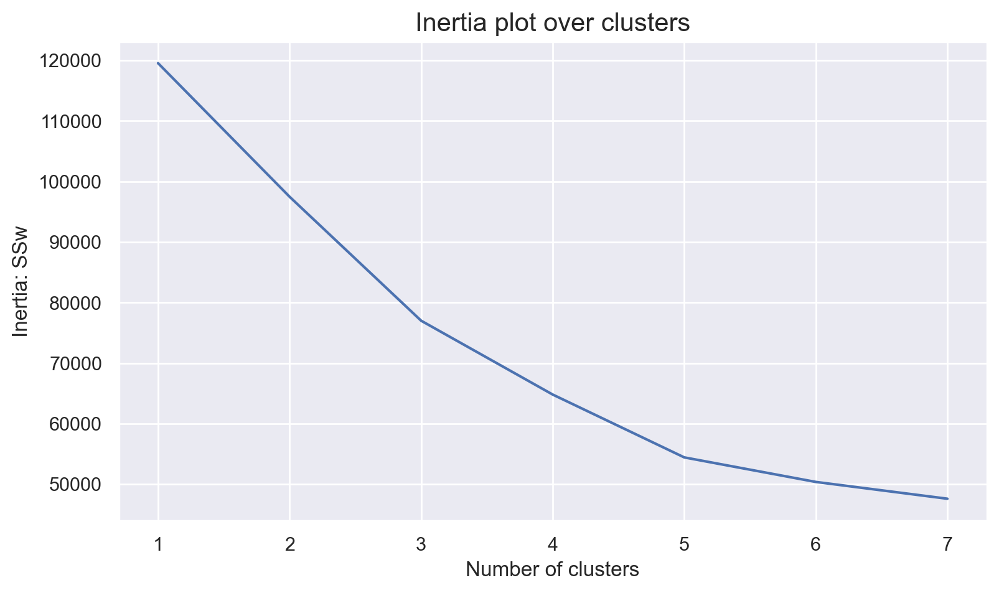

In [92]:
#Plotting the inertia
fig, ax = plt.subplots(figsize=(9,5))

ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

Using the elbow method, we can see that the inflection point is the point **3**.

Using the silhoutte coefficient value to find the best number of clusters for the K-means.

For n_clusters = [1:35m2[1:0m, the average silhouette_score is : [1:35m0.346018012014771[1:0m
For n_clusters = [1:35m3[1:0m, the average silhouette_score is : [1:35m0.38823878137810697[1:0m
For n_clusters = [1:35m4[1:0m, the average silhouette_score is : [1:35m0.2801540959026985[1:0m
For n_clusters = [1:35m5[1:0m, the average silhouette_score is : [1:35m0.306808976882578[1:0m
For n_clusters = [1:35m6[1:0m, the average silhouette_score is : [1:35m0.20713139943396455[1:0m
For n_clusters = [1:35m7[1:0m, the average silhouette_score is : [1:35m0.21364430238270357[1:0m


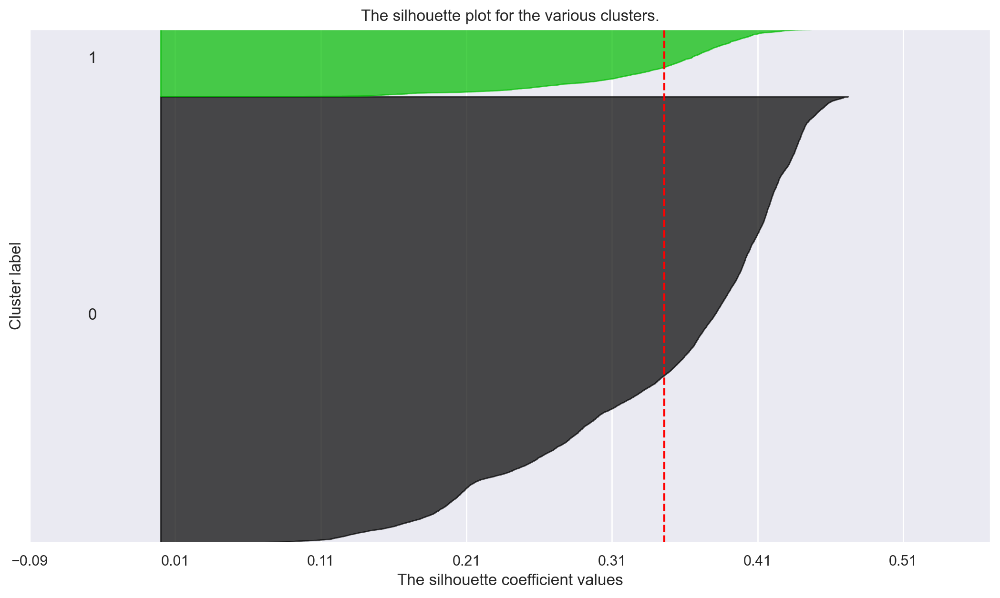

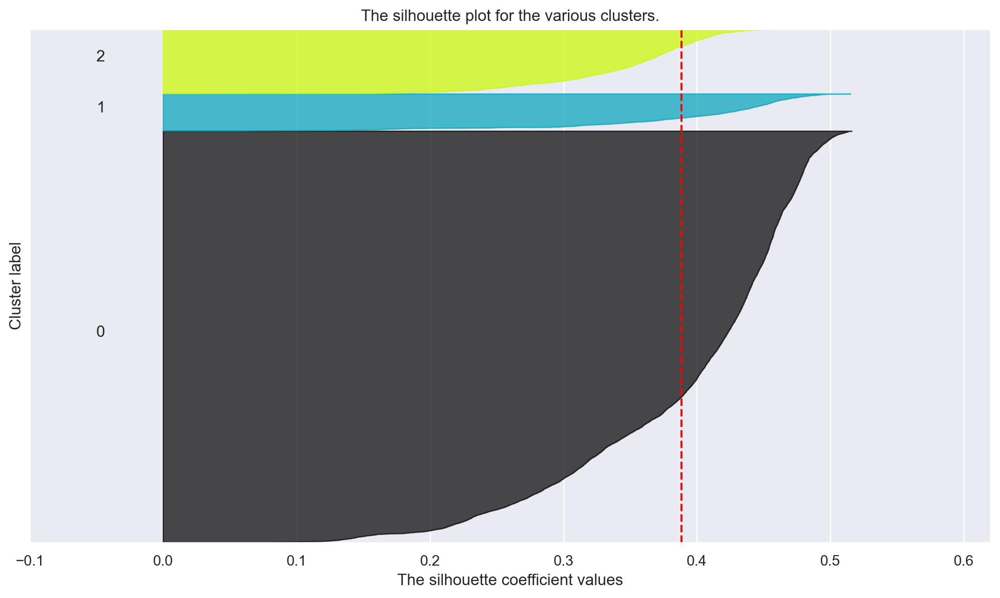

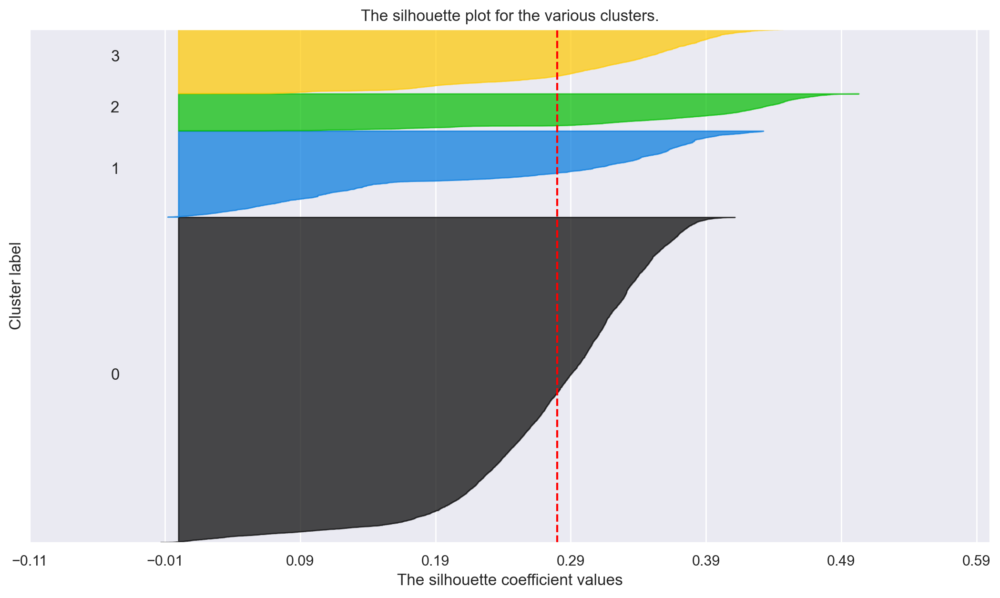

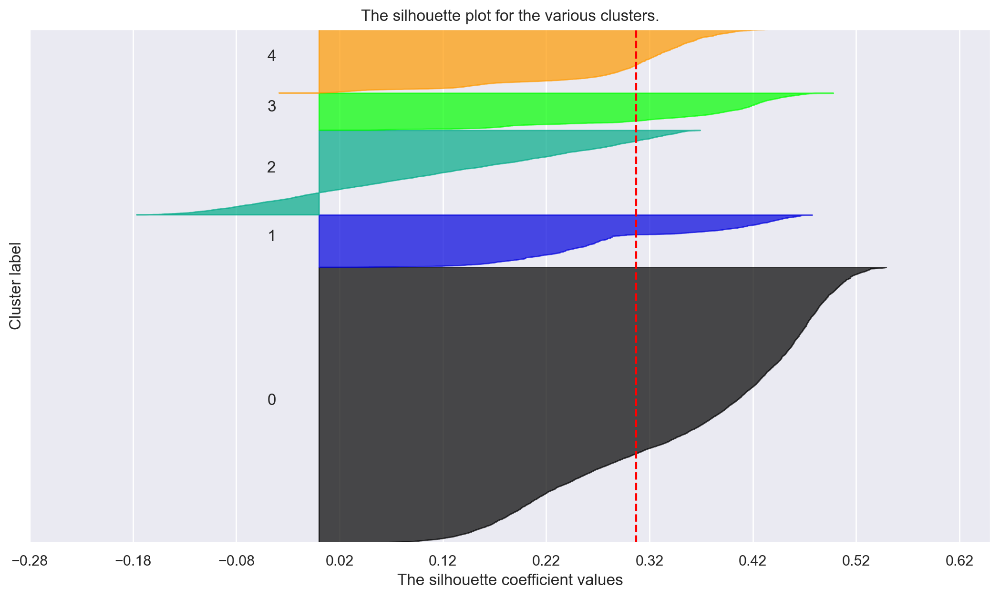

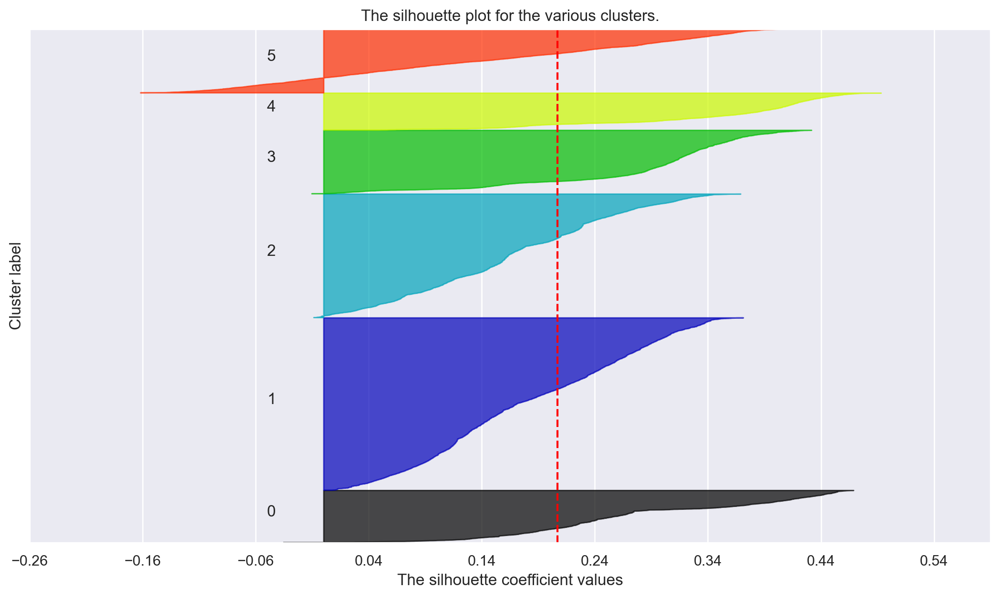

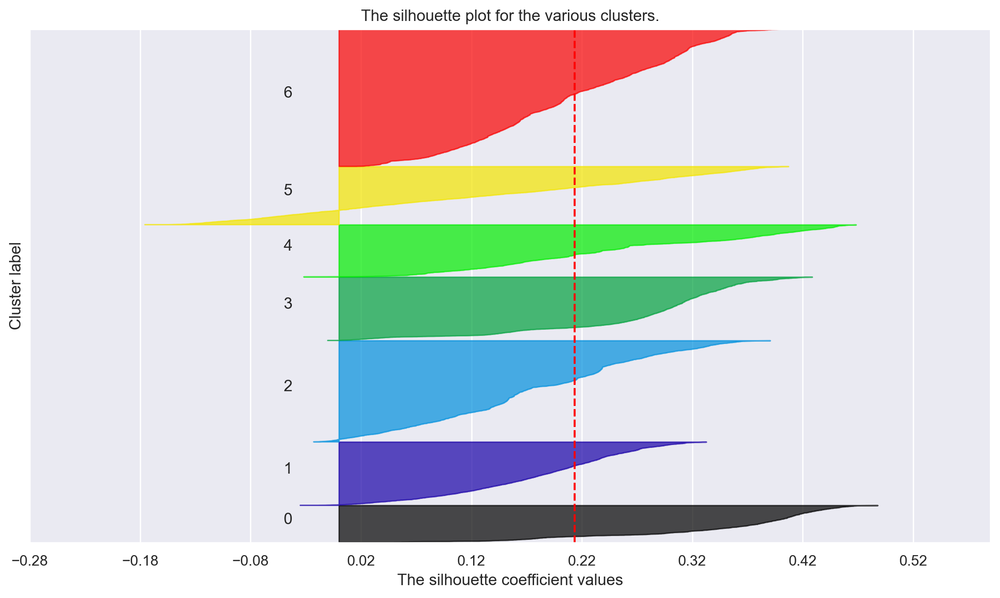

In [93]:

# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(food_df[customer_preferences_profile])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(food_df[customer_preferences_profile], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = \033[1:35m{nclus}\033[1:0m, the average silhouette_score is : \033[1:35m{silhouette_avg}\033[1:0m")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(food_df[customer_preferences_profile], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(food_df[customer_preferences_profile]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

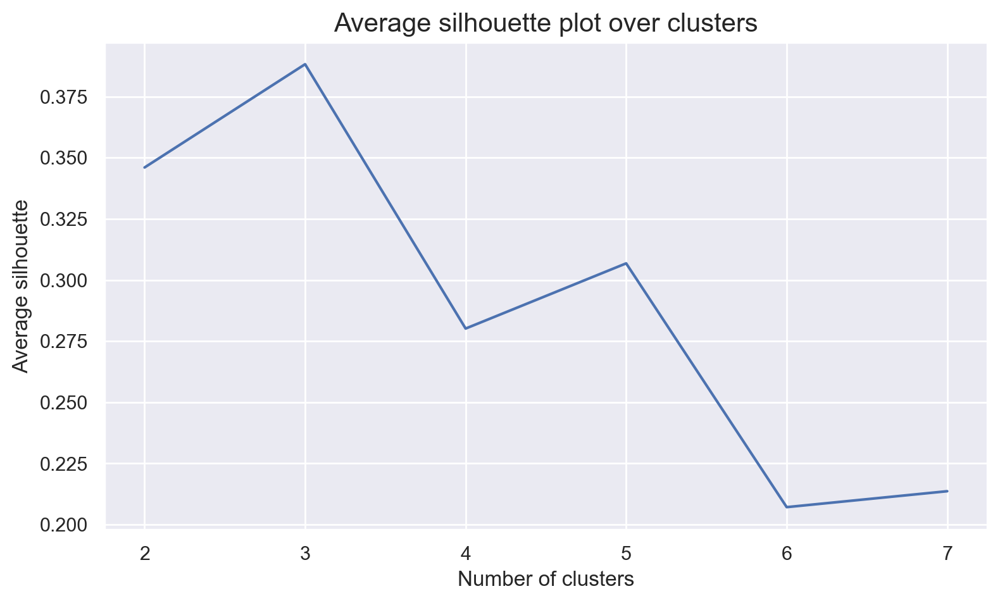

In [94]:
# The average silhouette plot
plt.figure(figsize=(9,5))

plt.plot(range_clusters[1:], 
         avg_silhouette)     #Skip nclus == 1

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

It is now evident that using number of clusters equal to 3, would give us a higher silhouette coefficient value. Hence, that is the number o clusters we will use.

In [95]:
#final cluster solution
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(food_df[customer_preferences_profile])
km_labels

array([0, 0, 0, ..., 0, 0, 0])

In [96]:
# Characterizing the final clusters
df_concat = pd.concat((food_df[customer_preferences_profile], pd.Series(km_labels, name='labels', index=food_df.index)), axis=1)
df_concat.groupby('labels').mean()

,CUI_Healthy,CUI_Street Food / Snacks,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages
labels,,,,,,,,,,
0,0.000000,0.000000,0.202210,0.295278,0.451602,-0.042952,-0.003386,-0.052150,-0.077156,0.321512
1,3.864392,0.224803,0.474258,0.354058,0.509817,0.094895,0.380563,-0.200813,-0.151218,0.333622
2,0.000000,2.961496,0.412281,0.061404,0.890977,-0.018045,0.150940,-0.237324,-0.062769,0.365587


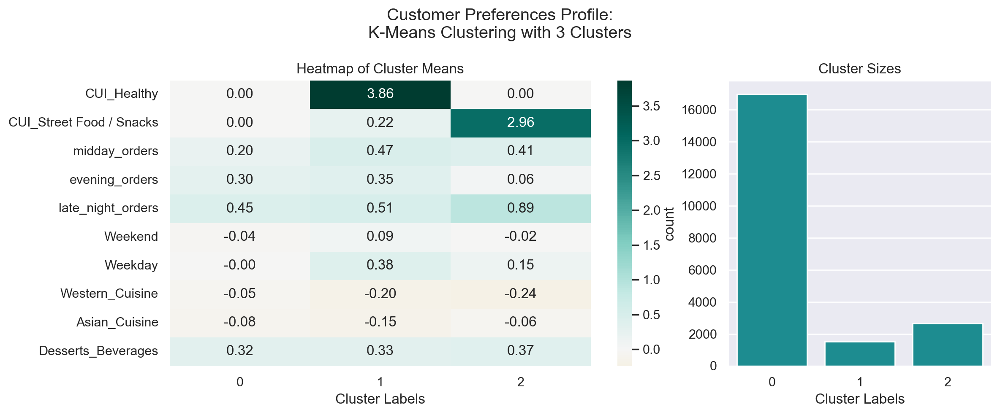

In [97]:
# Visualizing the final clusters
label_counts = None 

fig, axes = plt.subplots(1,2, figsize=(12,5), width_ratios=[.6,.3], tight_layout=True)

km_profile = df_concat.groupby('labels').mean().T

sns.heatmap(km_profile,
            center=0, annot=True, cmap="BrBG", fmt=".2f",
            ax=axes[0]
            )

axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")

sns.countplot(df_concat, x='labels', ax=axes[1], color=colors["BL"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

fig.suptitle("Customer Preferences Profile:\nK-Means Clustering with 3 Clusters")
plt.show()

>In the final clustering solution, we have the observe the following:
- `Cluster 2`: These are the main consumers of the CUI_Street Food/Snacks cuisine, they consume nothing on the CUI_Healthy. They buy mostly during the late_night hours and during the weekdays and they express low preference in Western and Asian Cuisine.
- `Cluster 1`: These customers seem niched in the Healthy style cuisine, although they present some food diveristy as they order also from  CUI_Street /Snacks and Desserts_Beverages. They make purchases during the midday, eveening and lat night hours, having late night hours sligtly higher. THe orders are msotly done during the Weekdays.
- `Cluster 0`: These are the rest of the customers. These customers have a high mean for Desserts_Beverages but express no preference for the CUI_HEalthy and CUI_Snacks.

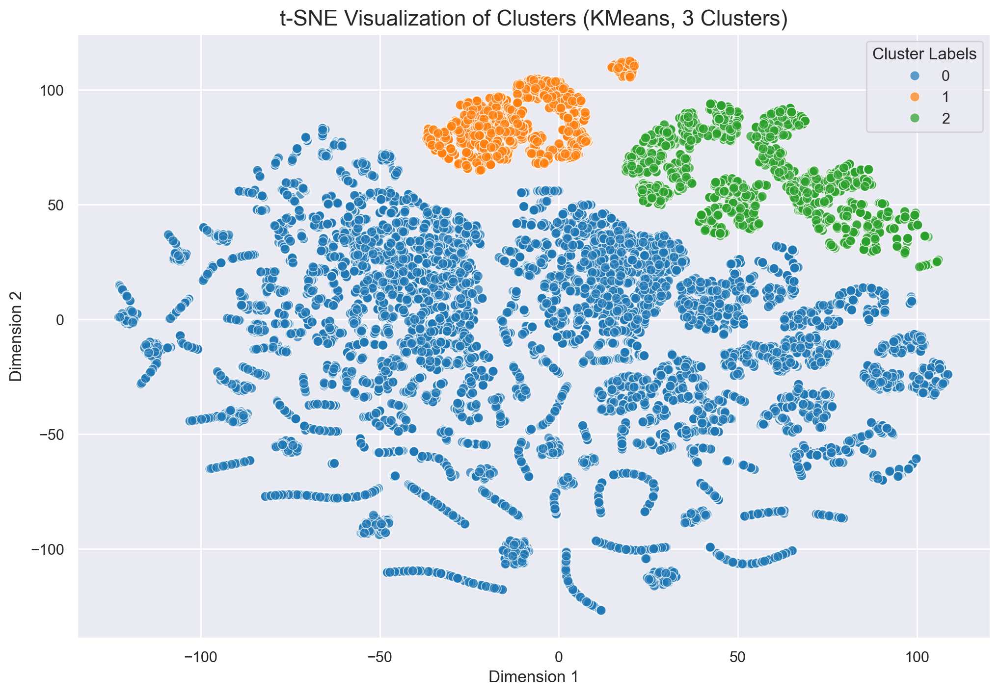

In [98]:

#Adjusting the model KMeans to the data
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(food_df[customer_preferences_profile])

# Reducing the dimensionality to 2D with t-SNE
two_dim = TSNE(random_state=42).fit_transform(food_df[customer_preferences_profile])

tsne_df = pd.DataFrame(two_dim, columns=['x', 'y'])
tsne_df['cluster'] = km_labels

#Visualizing the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='x', y='y', hue='cluster', data=tsne_df,
    palette='tab10', alpha=0.7, s=50
)

plt.title("t-SNE Visualization of Clusters (KMeans, 3 Clusters)", fontsize=16)
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend(title="Cluster Labels")
plt.grid(True)
plt.show()

Using the T-SNE, we can see that the 3 clusters are well separated.

#### Scores

Silhouette

In [99]:
# Silhouette Score for Hierarchical Clustering
km_silhouette = silhouette_score(food_df[customer_preferences_profile], km_labels)
print(f"K-Means (3 clusters) Silhouette Score: \033[1;35m{km_silhouette:.3f}\033[1;0m")

K-Means (3 clusters) Silhouette Score: 0.388


Calinski-Harabasz

In [100]:
# Calinski-Harabasz Index for K-Means
kmeans_chi = calinski_harabasz_score(food_df[customer_preferences_profile], km_labels)
print(f"K-Means Calinski-Harabasz Index: \033[1;35m{kmeans_chi:.3f}\033[1;0m")


K-Means Calinski-Harabasz Index: 5845.802


R2

In [101]:


#Compute WCSS (Within-Cluster Sum of Squares)
def calculate_wcss(data, labels, centroids):
    wcss = 0
    for i, center in enumerate(centroids):
        cluster_points = data[labels == i]
        wcss += np.sum((cluster_points - center) ** 2)
    return wcss

#Sum of squares
def calculate_tss(data):
    overall_mean = np.mean(data, axis=0)
    tss = np.sum((data - overall_mean) ** 2)
    return tss

#R2 Score
def calculate_r2(data, labels, centroids):
    wcss = calculate_wcss(data, labels, centroids)
    tss = calculate_tss(data)
    r2 = 1 - (wcss / tss)
    return r2


kmeans = KMeans(n_clusters=3, random_state=1).fit(food_df[customer_preferences_profile])
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

#Calculate R2 score
r2_score = calculate_r2(food_df[customer_preferences_profile].values, labels, centroids)
print(f"K-Means R^2 Score: \033[1;35m{r2_score:.3f}\033[1;0m")


K-Means R^2 Score: 0.292


### Customer Value Perspective

Repeating the same process but now for the customer vlaue profile

In [102]:
#Initializing the the algorithm
kmclust = KMeans(n_clusters=8, init='random', n_init=10, random_state=1)

In [103]:
#The fit method
kmclust.fit(food_df[customer_value_profile])

KMeans(init='random', n_init=10, random_state=1)

In [104]:
# The predict method
kmclust.predict(food_df[customer_value_profile])

array([0, 0, 0, ..., 4, 4, 4])

In [105]:
#Transforming the data
pd.DataFrame(kmclust.transform(food_df[customer_value_profile]))

,0,1,2,3,4,5,6,7
0,0.854742,2.994436,4.251793,4.123433,2.323546,1.281815,2.517488,1.976240
1,0.938408,2.878064,3.733677,3.295666,2.196126,1.284014,1.947384,1.239659
2,1.009534,3.086404,4.445456,4.398052,2.433956,1.406524,2.739400,2.239566
3,1.443588,4.032372,4.564891,3.352595,2.915629,2.507818,2.888721,1.386765
4,1.739835,4.117101,4.484267,3.056639,3.019620,2.685330,2.860353,1.307342
...,...,...,...,...,...,...,...,...
21167,2.820987,3.844520,4.807720,4.187764,1.184251,2.501054,3.097507,3.048840
21168,2.852383,3.892415,4.956102,4.457567,1.351959,2.539645,3.257693,3.217324
21169,3.597393,3.159655,3.225701,2.891123,2.048545,2.831351,2.203312,2.995649
21170,3.090750,3.413016,3.947638,3.475036,1.306044,2.493733,2.472901,2.879355


In [106]:
# Different initialization method and provide more n_init
kmclust = KMeans(n_clusters=8, init='k-means++', n_init=15, random_state=1)
kmclust.fit(food_df[customer_value_profile])

KMeans(n_init=15, random_state=1)

In [107]:
#Predicting to the dataframe
kmclust.predict(food_df[customer_value_profile])

array([1, 1, 1, ..., 6, 6, 6])

In [108]:
#Specifying the range of the clusters
range_clusters = range(1, 11)

In [109]:
#Getting the inertia for each cluster
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(food_df[customer_value_profile])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

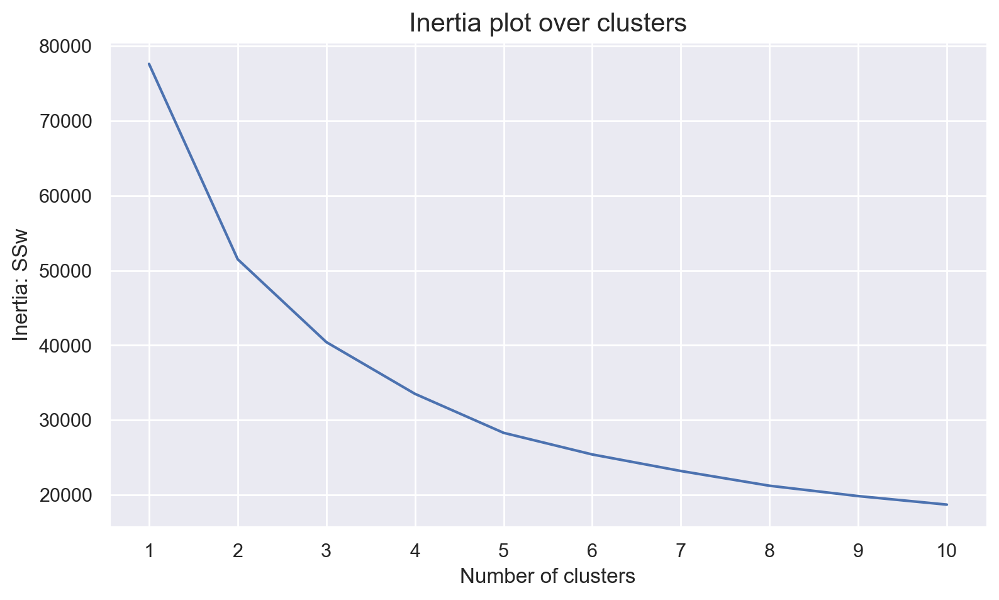

In [110]:
#Plotting the inertia 
fig, ax = plt.subplots(figsize=(9,5))
ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

The elbow method, shows the inflection point at 2. But we could also see at 3 has a slight further decrease in inertia. After trial and error  we realized that a third cluster provides a more meaningful interpretation. Hence, we chose to proceed with 3 clusters, but let us try other metrics.

Finding the best number of clusters using the silhouette 

For n_clusters = 2, the average silhouette_score is : 0.36185761077706735
For n_clusters = 3, the average silhouette_score is : 0.32668604598294737
For n_clusters = 4, the average silhouette_score is : 0.2714865896582163
For n_clusters = 5, the average silhouette_score is : 0.27872976269313043
For n_clusters = 6, the average silhouette_score is : 0.27348977301709854
For n_clusters = 7, the average silhouette_score is : 0.2596942627647609
For n_clusters = 8, the average silhouette_score is : 0.259292137114635
For n_clusters = 9, the average silhouette_score is : 0.24988912399832924
For n_clusters = 10, the average silhouette_score is : 0.2382266226026125


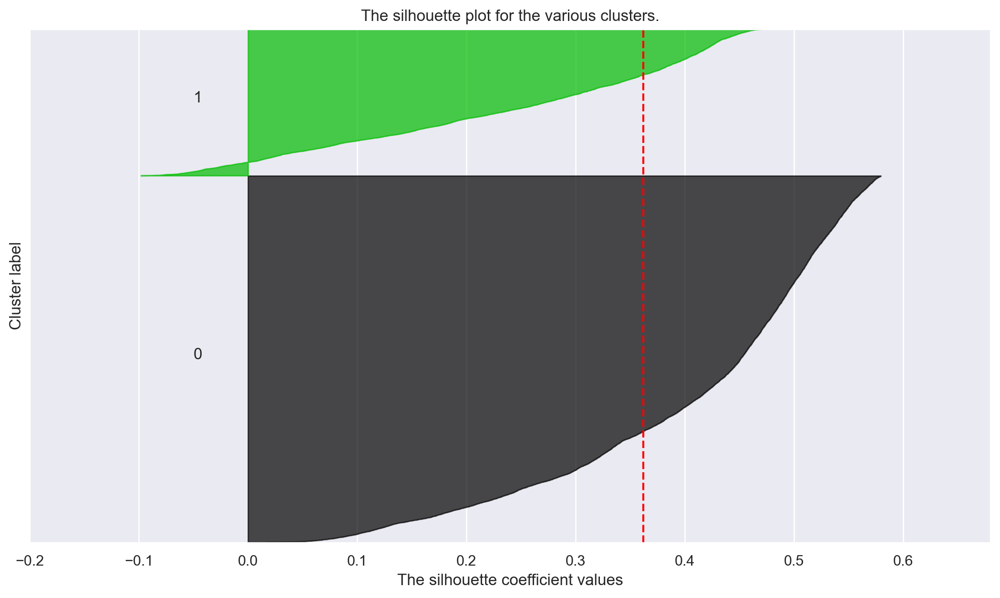

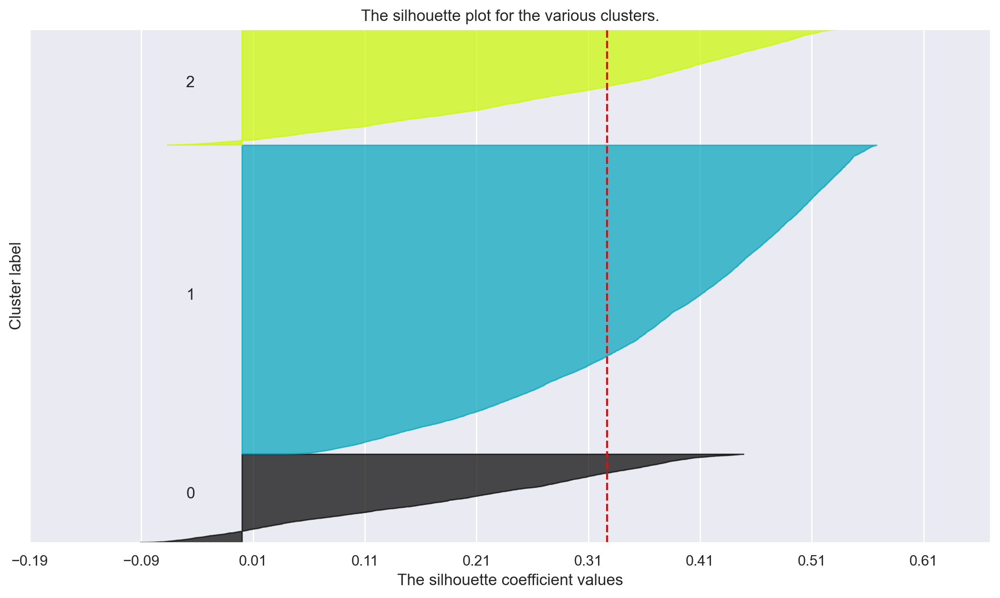

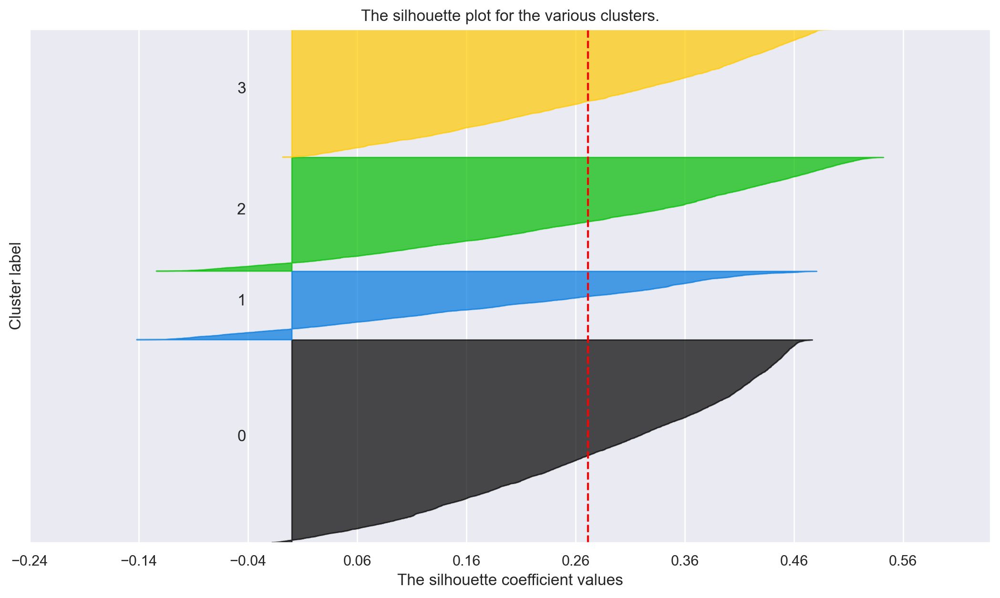

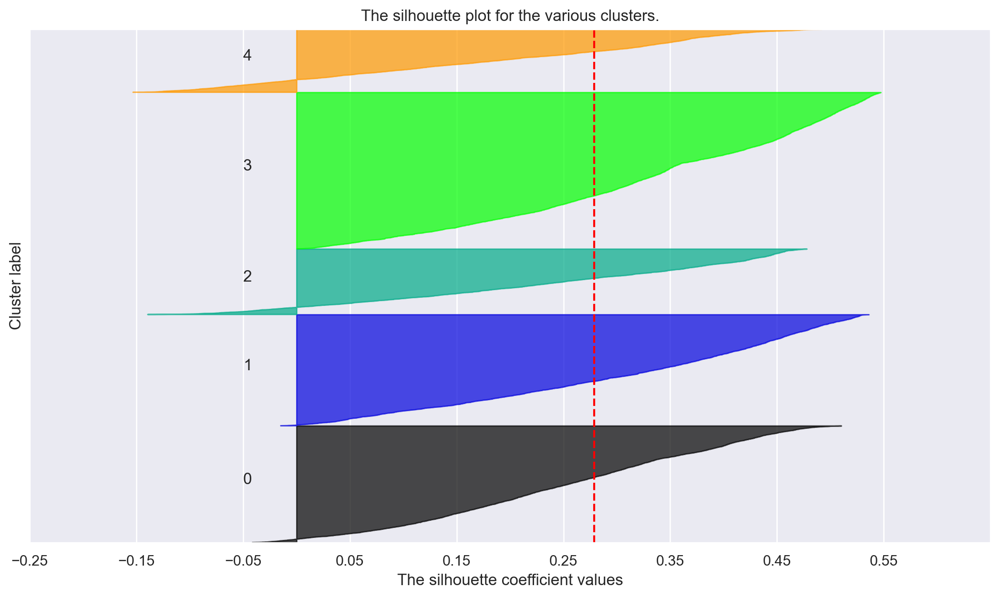

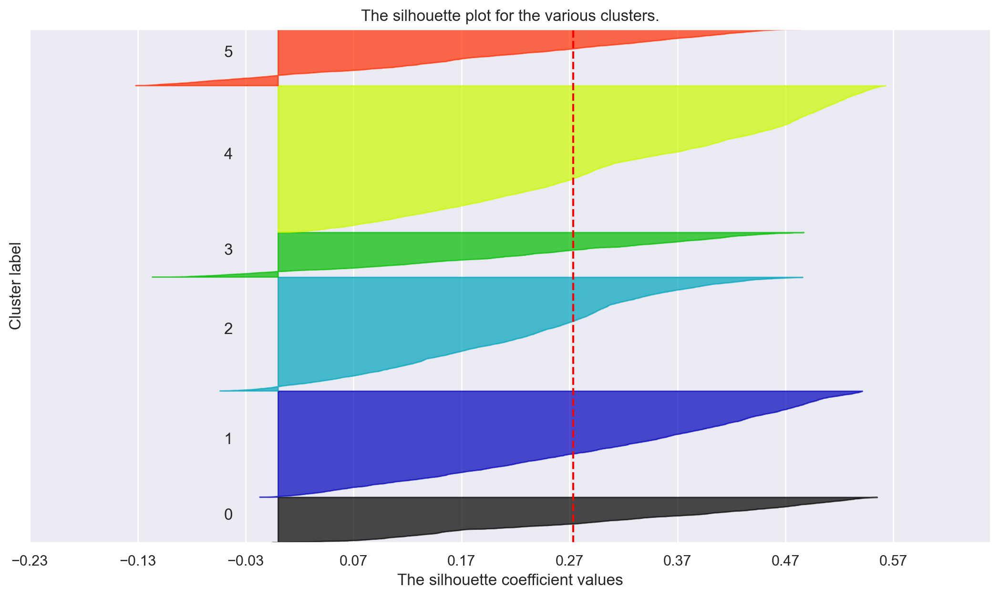

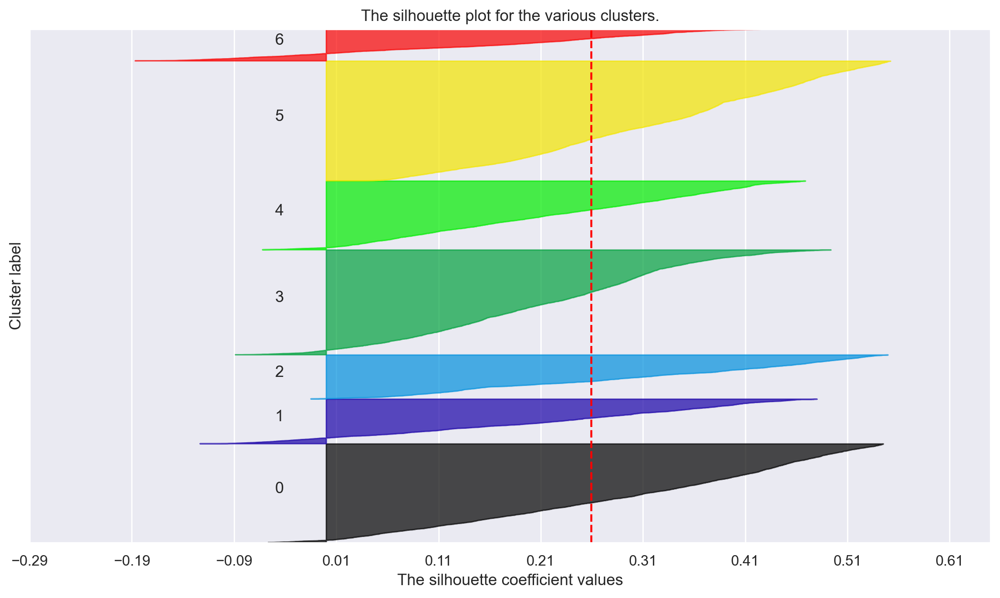

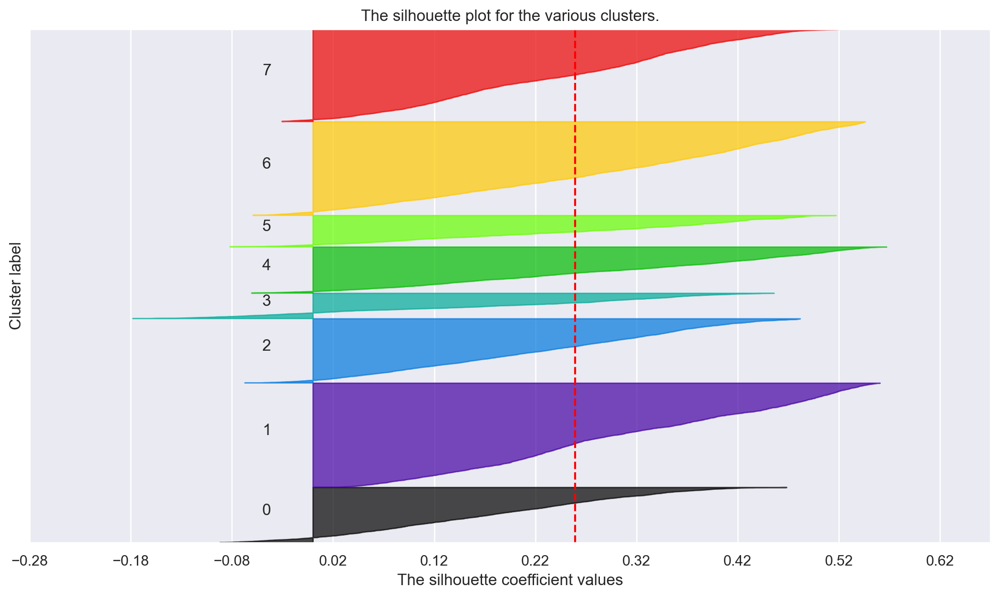

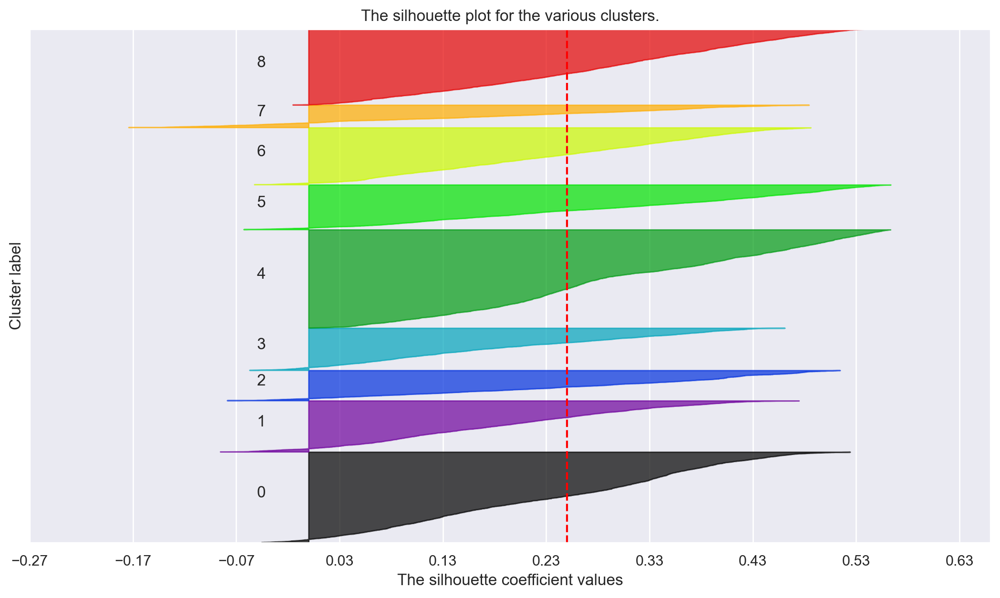

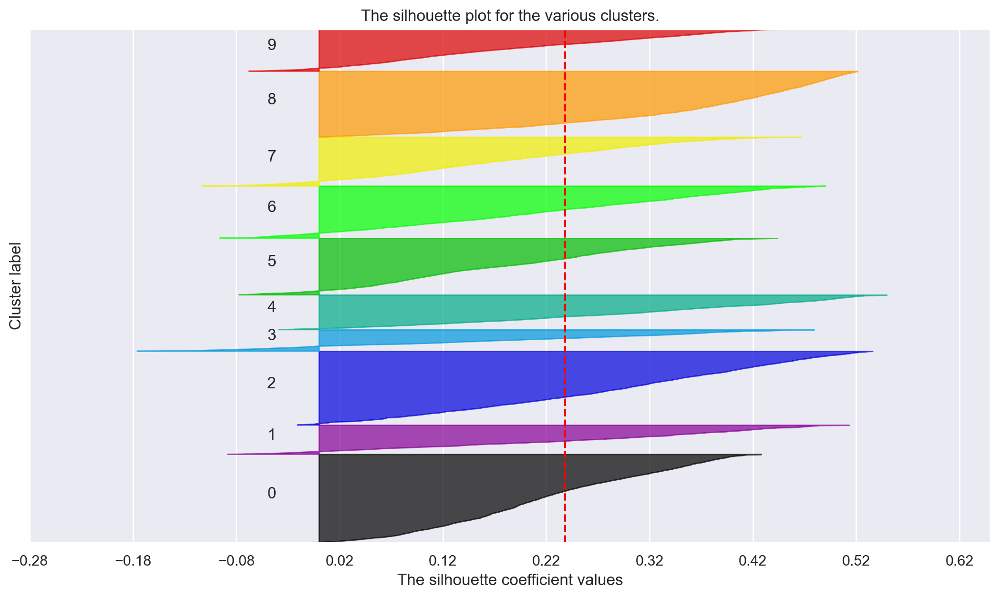

In [111]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(food_df[customer_value_profile])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(food_df[customer_value_profile], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(food_df[customer_value_profile], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(food_df[customer_value_profile]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

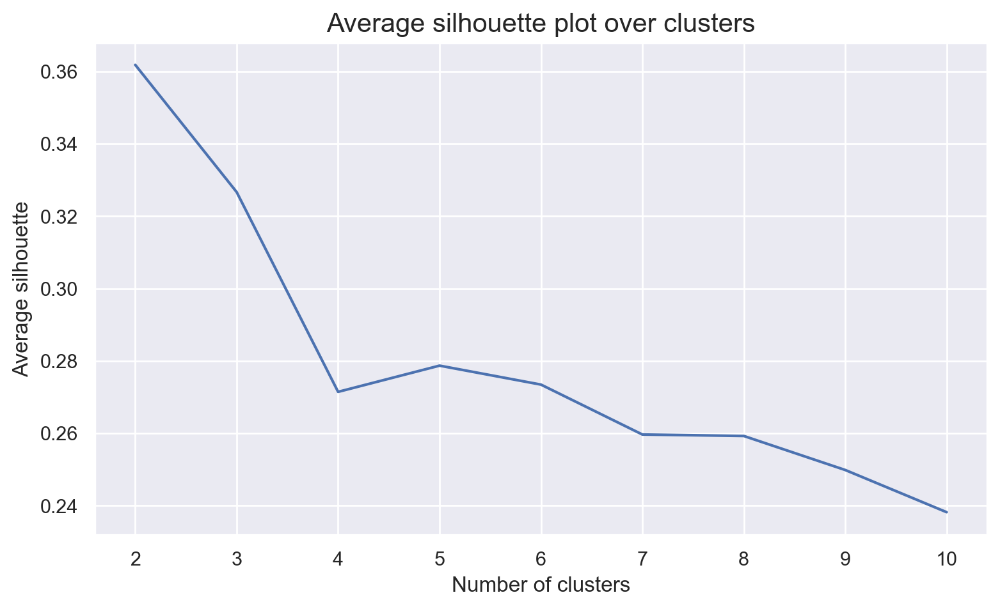

In [112]:
# The average silhouette plot
plt.figure(figsize=(9,5))

plt.plot(range_clusters[1:],
         avg_silhouette)     

plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

Although when the number of clusters is equal to 2, we have a higher average silhouette. We decided to proceed with the second best average, using 3 clusters instead. As this would give us more information in segmentation.

In [113]:
# final cluster solution
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(food_df[customer_value_profile])
km_labels

array([1, 1, 1, ..., 0, 1, 1])

In [114]:
# Characterizing the final clusters
df_concat = pd.concat((food_df[customer_value_profile], pd.Series(km_labels, name='labels', index=food_df.index)), axis=1)
df_concat.groupby('labels').mean()

,customer_lifetime,Average_Days_Between_Orders,average_spent_per_order,total_spent,total_orders,vendor_count
labels,,,,,,
0,-0.319156,0.249417,1.561615,1.055802,0.039415,-0.233059
1,-0.251316,0.350329,-0.148932,-0.244559,0.002719,-0.298259
2,0.193062,-0.492757,-0.011673,1.100100,1.576043,1.126936


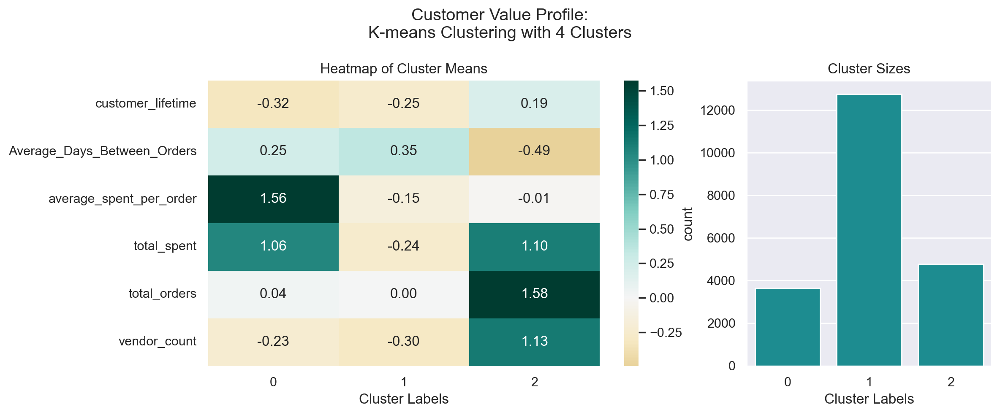

In [115]:
label_counts = None 

fig, axes = plt.subplots(1,2, figsize=(12,5), width_ratios=[.6,.3], tight_layout=True)

km_profile = df_concat.groupby('labels').mean().T

sns.heatmap(km_profile,
            center=0, annot=True, cmap="BrBG", fmt=".2f",
            ax=axes[0]
            )
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")

sns.countplot(df_concat, x='labels', ax=axes[1], color=colors["BL"])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

fig.suptitle("Customer Value Profile:\nK-means Clustering with 4 Clusters")
plt.show()

>In the final clustering solution, we have the observe the following:
- `Cluster 2`: These are the people who order the most, they also spend a lot on vendors, since they ordered the most, they also spent the most in general, with the lowest average days between orders
- `Cluster 1`: These are the customers that hvae the highest avergae days between orders, and the lowest orders from vendors.
- `Cluster 0`: These customers have the highets average spent per order, and a very high total ammpunt spent, overall, they buy less from vendors and have a lower customer lifetime.

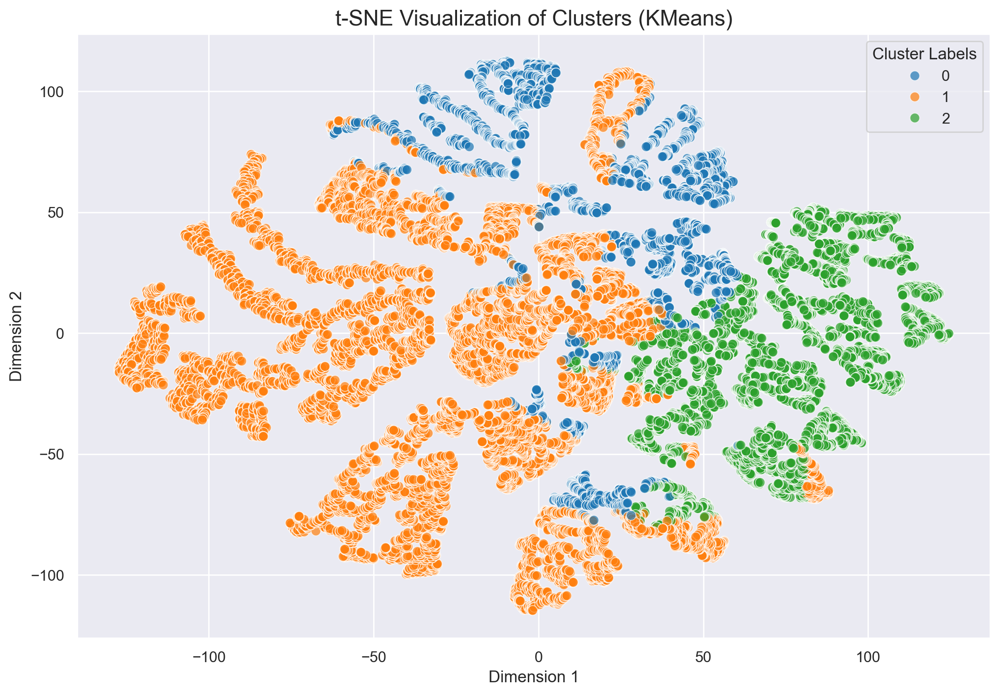

In [116]:

#Reducing the dimensionality to 2D with t-SNE
two_dim = TSNE(random_state=42).fit_transform(food_df[customer_value_profile])

#Adding the labels generated by KMeans to the DataFrame
tsne_df = pd.DataFrame(two_dim, columns=['x', 'y'])
tsne_df['cluster'] = km_labels

plt.figure(figsize=(12, 8))
sns.scatterplot(
    x='x', y='y', hue='cluster', data=tsne_df,
    palette='tab10', alpha=0.7, s=50
)

plt.title("t-SNE Visualization of Clusters (KMeans)", fontsize=16)
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.legend(title="Cluster Labels")
plt.grid(True)
plt.show()

Some points of the clusters are ovelapping between each other

#### Scores

Silhouette

In [117]:
# Silhouette Score for Hierarchical Clustering
km_silhouette = silhouette_score(food_df[customer_value_profile], km_labels)
print(f"K-Means (3 clusters) Silhouette Score: \033[1;35m{km_silhouette:.3f}\033[1;0m")

K-Means (3 clusters) Silhouette Score: 0.327


Calinski-Harabasz

In [118]:
# Calinski-Harabasz Index for K-Means
kmeans_chi = calinski_harabasz_score(food_df[customer_value_profile], km_labels)
print(f"K-Means Calinski-Harabasz Index: \033[1;35m{kmeans_chi:.3f}\033[1;0m")


K-Means Calinski-Harabasz Index: 9736.893


R2

In [119]:
#Compute WCSS (Within-Cluster Sum of Squares)
def calculate_wcss(data, labels, centroids):
    wcss = 0
    for i, center in enumerate(centroids):
        cluster_points = data[labels == i]
        wcss += np.sum((cluster_points - center) ** 2)
    return wcss

#Sum of squares
def calculate_tss(data):
    overall_mean = np.mean(data, axis=0)
    tss = np.sum((data - overall_mean) ** 2)
    return tss

#R2 Score
def calculate_r2(data, labels, centroids):
    wcss = calculate_wcss(data, labels, centroids)
    tss = calculate_tss(data)
    r2 = 1 - (wcss / tss)
    return r2


kmeans = KMeans(n_clusters=3, random_state=1).fit(food_df[customer_value_profile])
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

#Calculate R2 score
r2_score = calculate_r2(food_df[customer_value_profile].values, labels, centroids)
print(f"K-Means R^2 Score: \033[1;35m{r2_score:.3f}\033[1;0m")

K-Means R^2 Score: 0.479


## MEAN-SHIFT

### Customer Preference Perspective

Getting the best quantile by the avergae silhouette score.

In [120]:

# Gettting the best quantile
quantiles = [0.01, 0.02, 0.05, 0.1, 0.15]
best_quantile = None
best_score = -1

# Iterate over quantiles
for quantile in quantiles:
    bandwidth = estimate_bandwidth(food_df[customer_preferences_profile], quantile=quantile, random_state=1, n_jobs=-1)
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
    labels = ms.fit_predict(food_df[customer_preferences_profile])
    
    # Skip single-cluster results
    if len(set(labels)) > 1:
        score = silhouette_score(food_df[customer_preferences_profile], labels)
        print(f"Quantile: {quantile}, Silhouette Score: {score:.4f}, Clusters: {len(set(labels))}")
        if score > best_score:
            best_score = score
            best_quantile = quantile

print(f"Best Quantile: \033[1;35m{best_quantile}\033[1;0m, Best Silhouette Score: \033[1;35m{best_score:.4f}\033[1;0m")


Quantile: 0.01, Silhouette Score: 0.1516, Clusters: 255
Quantile: 0.02, Silhouette Score: 0.1754, Clusters: 94
Quantile: 0.05, Silhouette Score: 0.3656, Clusters: 12
Quantile: 0.1, Silhouette Score: 0.3861, Clusters: 4
Quantile: 0.15, Silhouette Score: 0.3861, Clusters: 4
Best Quantile: 0.1, Best Silhouette Score: 0.3861


In [121]:
# Using the results from the previous iteration to get the bandwidth
bandwidth = estimate_bandwidth(food_df[customer_preferences_profile], quantile=0.15, random_state=1, n_jobs=-1)
bandwidth


2.186252200278259

In [122]:
#Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(food_df[customer_preferences_profile])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 4


In [123]:
# Concatenating the labels to df
df_concat = pd.concat([food_df[customer_preferences_profile], pd.Series(ms_labels, index=food_df.index, name="ms_labels")], axis=1)
df_concat.head()

,CUI_Healthy,CUI_Street Food / Snacks,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages,ms_labels
0,0.0,0.0,0.333333,0.000000,0.0,0.0,-0.5,0.103421,-0.701050,0.00000,0
1,0.0,0.0,-0.333333,0.666667,0.0,0.5,-1.0,-0.622102,0.268825,0.00000,0
2,0.0,0.0,0.333333,0.000000,0.0,0.0,-0.5,-0.039866,-0.701050,0.99194,0
3,0.0,0.0,0.333333,-0.333333,0.0,0.0,-1.0,-0.622102,0.314110,0.00000,0
4,0.0,0.0,0.000000,0.000000,0.0,0.0,-1.0,0.612104,-0.701050,0.00000,0


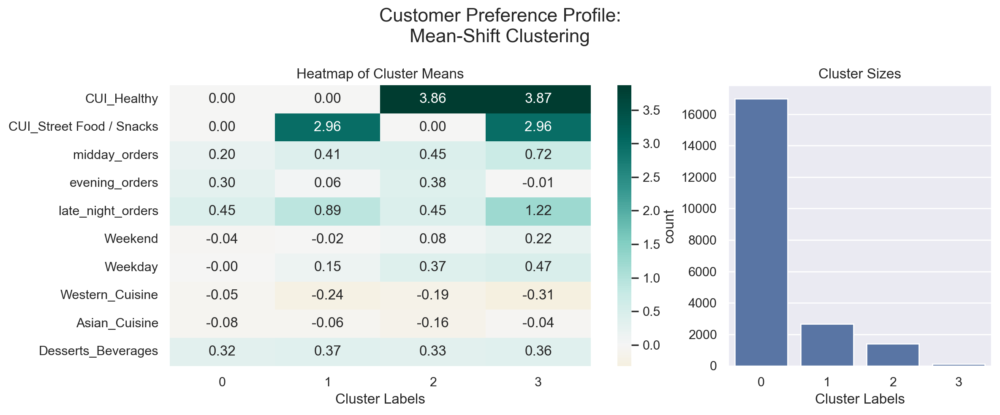

In [124]:
#Grouping by the cluster labels and calculating mean for each feature
km_profile = df_concat.groupby('ms_labels').mean().T

#Creating subplots for heatmap and count plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.3], tight_layout=True)

# Heatmap of cluster means
sns.heatmap(
    km_profile,
    center=0, 
    annot=True, 
    cmap="BrBG", 
    fmt=".2f", 
    ax=axes[0]
)
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")

# Bar plot of cluster sizes
sns.countplot(x='ms_labels', data=df_concat, ax=axes[1])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

fig.suptitle("Customer Preference Profile:\nMean-Shift Clustering", fontsize=16)
plt.show()


>The Mean-shift resulted in the follwoing clusters:
- `Cluster 0`: IN general, the customers who don't spend either from CUI_HEALTHY nor CUI_Street Food/Snacks, they order themost in Western Cuisine and Desserts_Beverages.
- `Cluster 1`:These are the CUI_Street/Snacks niche customers, that mostly buy from that cuisine, they moslty buy either at midday or late night hours, they do not spend on CUI_Healthy.
- `Cluster 2`: These are the CUI_Healthy niche customers, that mostly buy from that cuisine, their distribution of the hour of the day seems even, ordering at midday, evening and late night, they also buy mostly during the weekday
- `Cluster 3`:The poeple who buy from the CUI_Healthy and and Street Foor/Snacks, they buy eithe rduring the midday or the late night hours

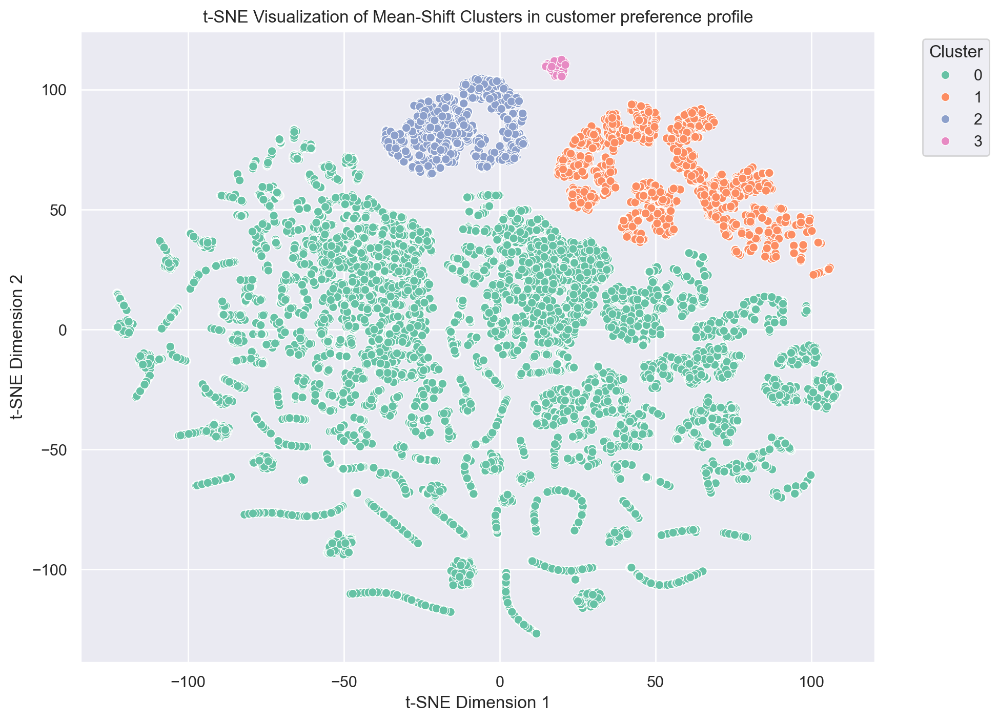

In [125]:
#Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(food_df[customer_preferences_profile].values)

# Add t-SNE results and cluster labels to a DataFrame
tsne_df = pd.DataFrame(tsne_results, columns=["t-SNE1", "t-SNE2"])
tsne_df['Cluster'] = ms_labels

# Plot t-SNE results with clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="t-SNE1", 
    y="t-SNE2", 
    hue="Cluster", 
    palette="Set2", 
    data=tsne_df, 
    legend="full"
)

plt.title("t-SNE Visualization of Mean-Shift Clusters in customer preference profile")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


The 4 clusters seem to be well separated 

#### Scores

R2

In [126]:
def get_ss_score(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [127]:
# Computing the R^2 of the cluster solution
sst = get_ss_score(food_df[customer_preferences_profile])  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss_score)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.3644


In [128]:

# Calinski-Harabasz Index:
calinski_harabasz = calinski_harabasz_score(food_df[customer_preferences_profile], df_concat['ms_labels'])
print("Calinski-Harabasz Index: %0.4f" % calinski_harabasz)

Calinski-Harabasz Index: 4045.9949


In [129]:
# Silhouette Score:
silhouette = silhouette_score(food_df[customer_preferences_profile], df_concat['ms_labels'], metric='euclidean')
print("Silhouette Score: %0.4f" % silhouette)

Silhouette Score: 0.3861


### Customer Value Perspective

Getting the best parameters for the algorithm

In [130]:

# Gettting the best quantile
quantiles = [0.01, 0.02, 0.05, 0.1, 0.15]
best_quantile = None
best_score = -1
# Iterate over the quantiles
for quantile in quantiles:
    bandwidth = estimate_bandwidth(food_df[customer_value_profile], quantile=quantile, random_state=1, n_jobs=-1)
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=-1)
    labels = ms.fit_predict(food_df[customer_value_profile])
    
    # Skip single-cluster results
    if len(set(labels)) > 1:
        score = silhouette_score(food_df[customer_value_profile], labels)
        print(f"Quantile: {quantile}, Silhouette Score: {score:.4f}, Clusters: {len(set(labels))}")
        if score > best_score:
            best_score = score
            best_quantile = quantile

print(f"Best Quantile: \033[1;35m{best_quantile}\033[1;0m, Best Silhouette Score: \033[1;35m{best_score:.4f}\033[1;0m")


Quantile: 0.01, Silhouette Score: 0.0867, Clusters: 113
Quantile: 0.02, Silhouette Score: 0.1524, Clusters: 28
Quantile: 0.05, Silhouette Score: 0.2788, Clusters: 7
Quantile: 0.1, Silhouette Score: 0.4320, Clusters: 3
Quantile: 0.15, Silhouette Score: 0.4737, Clusters: 2
Best Quantile: 0.15, Best Silhouette Score: 0.4737


In [131]:
# Using the results from the previous iteration to get the bandwidth
bandwidth = estimate_bandwidth(food_df[customer_value_profile], quantile=0.15, random_state=1, n_jobs=-1)
bandwidth


1.4842165853977927

In [132]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(food_df[customer_value_profile])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 2


This resulted in 2 clusters, which seemed small, but let us proceed and check the results

In [133]:
# Concatenating the labels to df
df_concat = pd.concat([food_df[customer_value_profile], pd.Series(ms_labels, index=food_df.index, name="ms_labels")], axis=1)
df_concat.head()

,customer_lifetime,Average_Days_Between_Orders,average_spent_per_order,total_spent,total_orders,vendor_count,ms_labels
0,0.645161,0.872093,-0.631579,-0.570526,0.000000,0.0,0
1,0.645161,0.872093,0.078236,-0.044912,0.000000,0.0,0
2,0.645161,0.872093,-0.863442,-0.741404,0.000000,0.0,0
3,0.645161,1.918605,0.607397,-0.076842,-0.333333,-0.5,0
4,0.645161,1.918605,0.971550,0.102105,-0.333333,-0.5,0


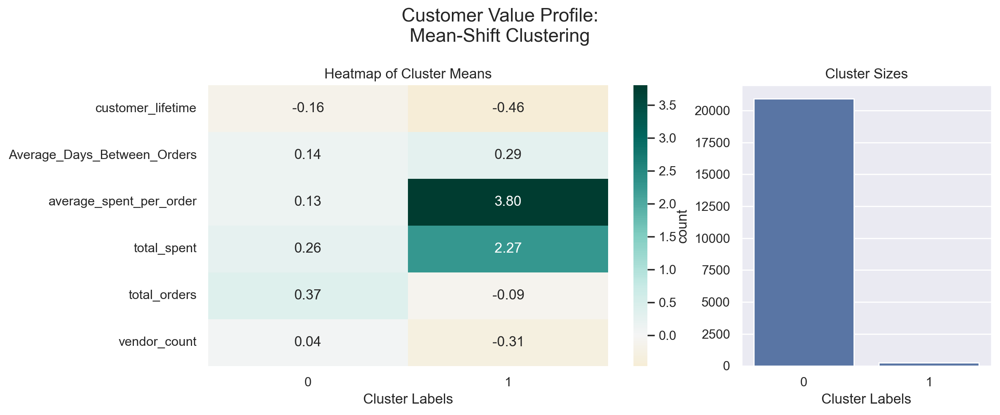

In [134]:
# Assuming `df_concat` is the DataFrame with cluster labels added
# Group by the cluster labels and calculate mean for each feature
km_profile = df_concat.groupby('ms_labels').mean().T

# Create subplots for heatmap and count plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.3], tight_layout=True)

# Heatmap of cluster means
sns.heatmap(
    km_profile,
    center=0, 
    annot=True, 
    cmap="BrBG", 
    fmt=".2f", 
    ax=axes[0]
)
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")

# Bar plot of cluster sizes
sns.countplot(x='ms_labels', data=df_concat, ax=axes[1])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

# Add overall title
fig.suptitle("Customer Value Profile:\nMean-Shift Clustering", fontsize=16)
plt.show()


>The Mean-shift for customer value profile, resulted in only 2 clusters:
- `Cluster 0`: Are the customers who spend the most on average per order and in total, these customers also have the highest average days between orders, having consequently, the lowest customer lifetime
- `Cluster 1`: These are the customers that ordered the most, being the most active ones, as they they have the lowest avergae days between orders and higher customer lifetime

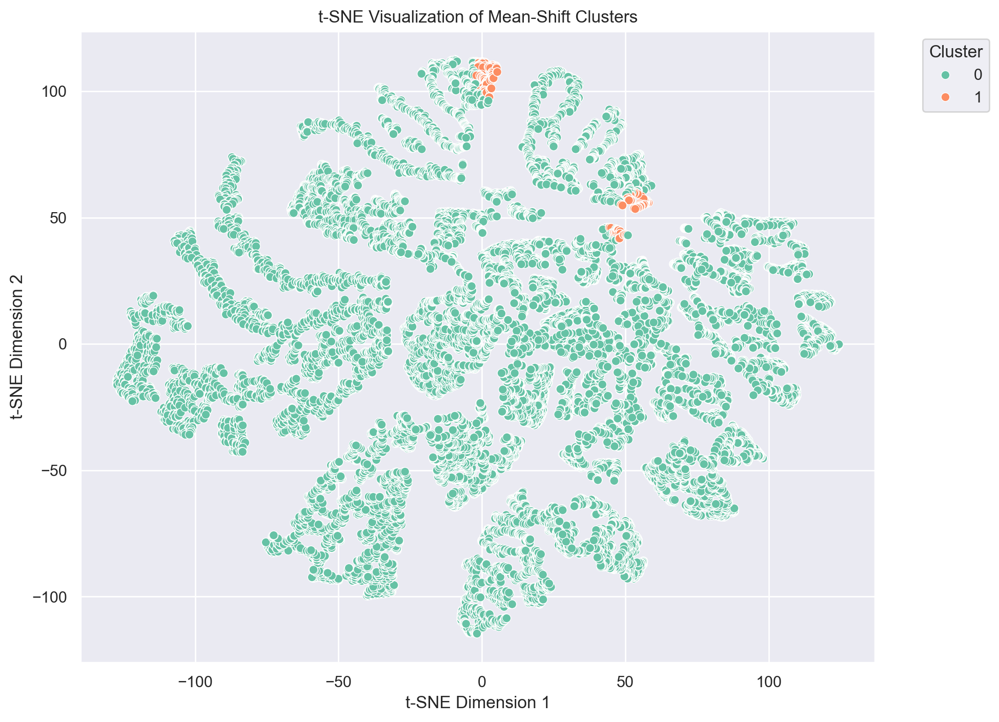

In [135]:
# Perform t-SNE dimensionality reduction
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(food_df[customer_value_profile].values)

# Add t-SNE results and cluster labels to a DataFrame
tsne_df = pd.DataFrame(tsne_results, columns=["t-SNE1", "t-SNE2"])
tsne_df['Cluster'] = ms_labels

# Plot t-SNE results with clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="t-SNE1", 
    y="t-SNE2", 
    hue="Cluster", 
    palette="Set2", 
    data=tsne_df, 
    legend="full"
)

plt.title("t-SNE Visualization of Mean-Shift Clusters")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


It seems that the algorithm couldn't separate well the clusters for the customer value profile

#### Scores

In [136]:
# Computing the R^2 of the cluster solution
sst = get_ss_score(food_df[customer_value_profile])  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss_score)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0563


In [137]:

# Calinski-Harabasz Index:
calinski_harabasz = calinski_harabasz_score(food_df[customer_value_profile], df_concat['ms_labels'])
print("Calinski-Harabasz Index: %0.4f" % calinski_harabasz)

Calinski-Harabasz Index: 1263.3519


In [138]:
# Silhouette Score:
silhouette = silhouette_score(food_df[customer_value_profile], df_concat['ms_labels'], metric='euclidean')
print("Silhouette Score: %0.4f" % silhouette)

Silhouette Score: 0.4737


## Hierarchical Clustering

Getting the best linkage for the clustering algorithm using the R^2

In [139]:
def get_rsq(df, feats, label_col):
    """
    Calculate the R-squared value for a given DataFrame and features.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing the data.
    feats (list): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing the labels or cluster assignments.

    Returns:
    float: The R-squared value, representing the proportion of variance explained by the clustering.
    """

    df_sst_ = get_ss(df, feats)                 # get total sum of squares
    df_ssw_ = get_ssw(df, feats, label_col)     # get ss within
    df_ssb_ = df_sst_ - df_ssw_                 # get ss between

    # r2 = ssb/sst 
    return (df_ssb_/df_sst_)

In [140]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    feats = df.columns.tolist()
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, metric=dist, linkage=link_method)
        
        #get cluster labels
        hclabels = cluster.fit_predict(df) 
        
        # concat df with labels
        df_concat = pd.concat([df, pd.Series(hclabels, name='labels', index=df.index)], axis=1)  
        
        
        # append the R2 of the given cluster solution
        r2.append(get_rsq(df_concat, feats, 'labels'))
        
    return np.array(r2)


In [141]:


hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc = np.vstack([ get_r2_hc(food_df[food_numerical], 
                              link, 
                              max_nclus=max_nclus, 
                              min_nclus=1, 
                              dist="euclidean") 
                              for link in hc_methods])

In [142]:
r2_hc_methods = pd.DataFrame(r2_hc.T, index=range(1, max_nclus + 1), columns=hc_methods)


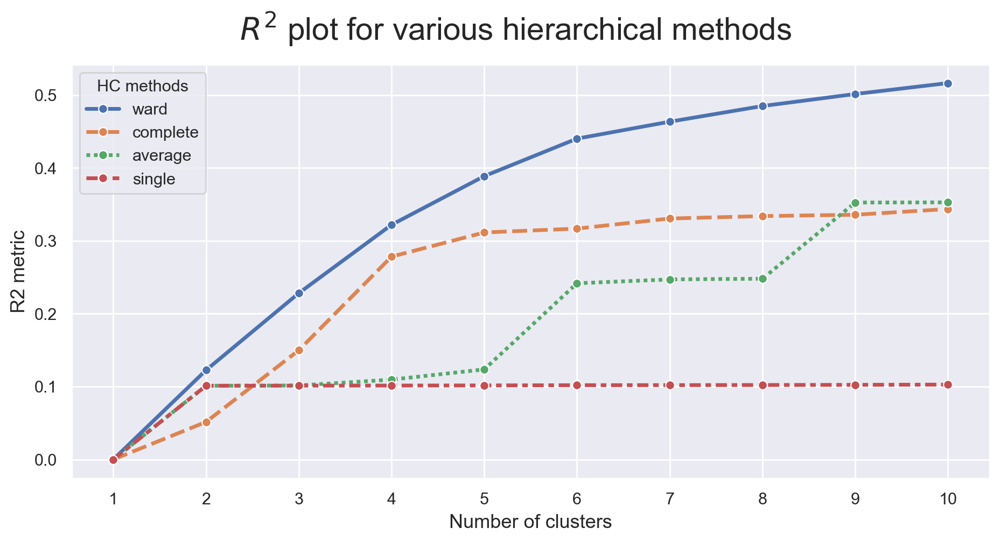

In [143]:

sns.set()

fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

fig.suptitle("$R^2$ plot for various hierarchical methods", fontsize=21)

plt.show()

The Ward method is the linkage method with the highest R2 score, indicating the best clustering performance in terms of explaining the data's variance. For that reason, it will be the one we'll use.

### Customer Preference Perspective

In [144]:
#setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(food_df[customer_preferences_profile])

array([16613, 16768, 13940, ...,     4,     1,     0], dtype=int64)

In [145]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# iterate through each merge
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

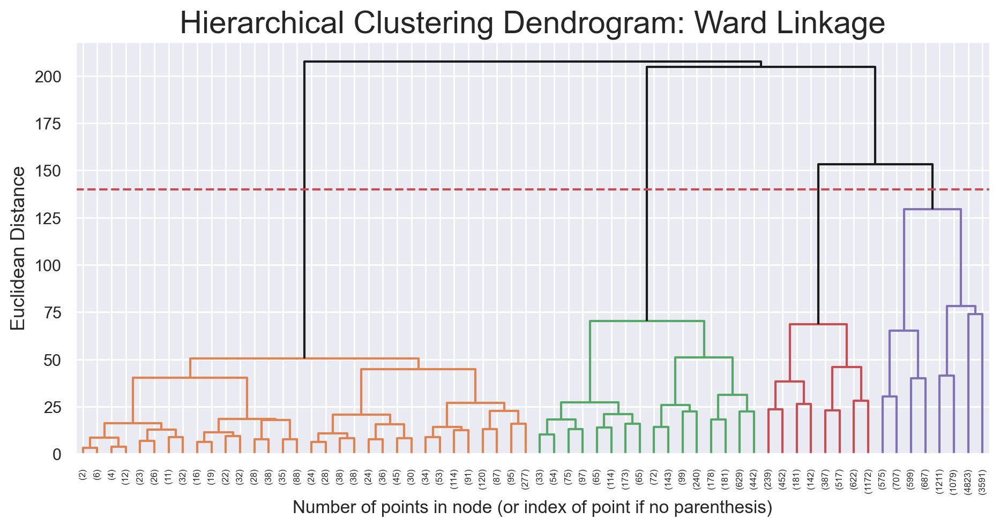

In [146]:
# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
y_threshold = 140
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [147]:
linkage = 'ward'
distance = 'euclidean'
n_clusters = 4

hc4_clust = AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=n_clusters)
hc4_labels = hc4_clust.fit_predict(food_df[customer_preferences_profile])

In [148]:
# Characterizing the 4 clusters
df_concat = pd.concat([food_df[customer_preferences_profile], 
                       pd.Series(hc4_labels, 
                                 name='labels', 
                                 index=food_df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,CUI_Healthy,CUI_Street Food / Snacks,midday_orders,evening_orders,late_night_orders,Weekend,Weekday,Western_Cuisine,Asian_Cuisine,Desserts_Beverages
labels,,,,,,,,,,
0,0.000000,0.000000,0.248367,0.431836,0.046790,0.001168,0.034885,-0.011040,-0.128154,0.290625
1,0.000000,0.000000,0.037177,-0.192978,1.898976,-0.200700,-0.140221,-0.199135,0.105185,0.431946
2,0.000000,2.961496,0.412281,0.061404,0.890977,-0.018045,0.150940,-0.237324,-0.062769,0.365587
3,3.864392,0.224803,0.474258,0.354058,0.509817,0.094895,0.380563,-0.200813,-0.151218,0.333622


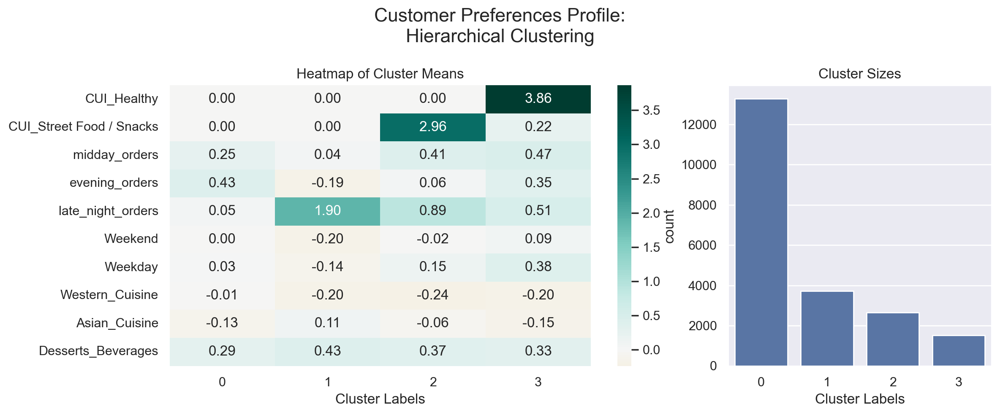

In [149]:
# Group by the cluster labels and calculate mean for each feature
hc_profile = df_concat.groupby('labels').mean().T

# Create subplots for heatmap and count plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.3], tight_layout=True)

# Heatmap of cluster means
sns.heatmap(
    hc_profile,
    center=0, 
    annot=True, 
    cmap="BrBG", 
    fmt=".2f", 
    ax=axes[0]
)
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")

# Bar plot of cluster sizes
sns.countplot(x='labels', data=df_concat, ax=axes[1])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

fig.suptitle("Customer Preferences Profile:\nHierarchical Clustering", fontsize=16)
plt.show()


>The hierarchical clustering algorithm gave us 4 clusters:
- `CLuster 0`: These customers don't buy from CUI_Healthy nor CUI_Street Food/Snacks, they order mostly during the evening, and rarely during the late-night hours.
- `CLuster 1`: Customers that don't buy from either Healthy or Street Food/Snacks, but they are the ones that buy the most form the Asian cuisine during the late night hours and less during the evening
- `CLuster 2`: The customers that buy the most in the CUI_Street Food/Snacks cuisine, they mostly order during the late-night hours and midday hours and during the weekdays
- `CLuster 3`: These are the ONLY customers that buy from the CUI_Healthy cuisine, they also buy from Street Food/Snacks and Desserts_Beverages. These customers buy mostly during the weekdays, but there is no distinction in the time of the day.

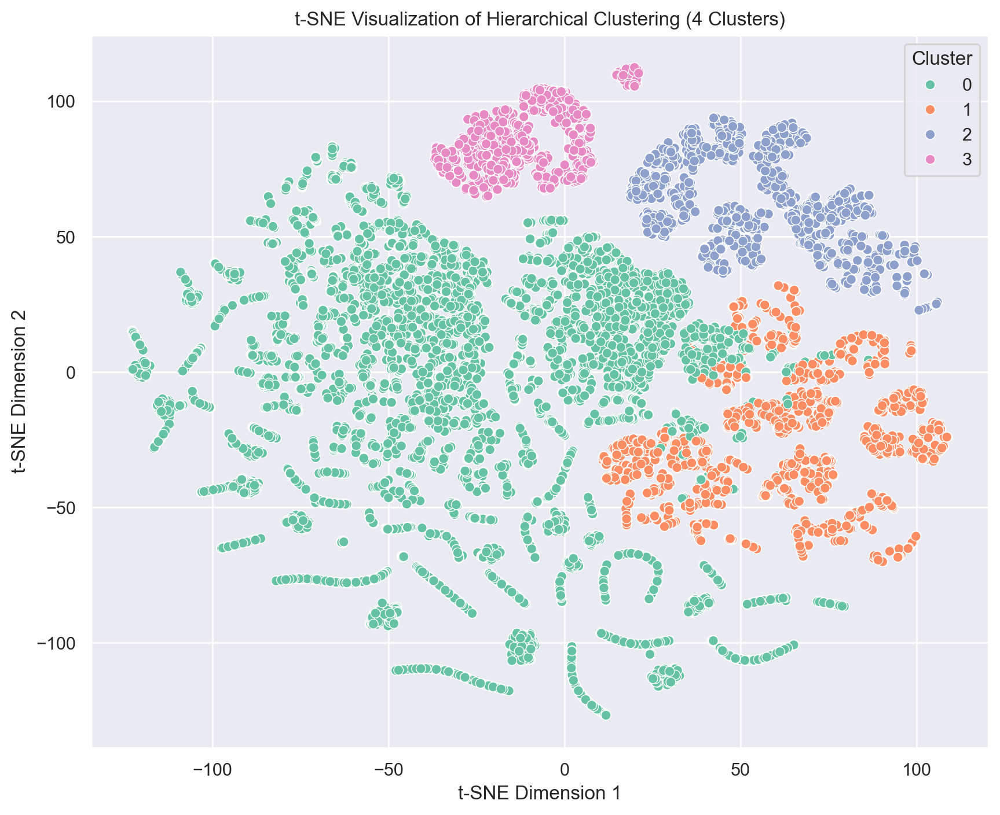

In [150]:
# Number of components for t-SNE
n_components = 2

# Run t-SNE on the customer preferences profile 
tsne = TSNE(n_components=n_components, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(food_df[customer_preferences_profile])

tsne_df = pd.DataFrame(tsne_results, columns=['t-SNE1', 't-SNE2'])
tsne_df['Cluster'] = hc4_labels  # Add cluster labels

plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='t-SNE1', y='t-SNE2', hue='Cluster', palette='Set2', data=tsne_df, legend='full'
)
plt.title('t-SNE Visualization of Hierarchical Clustering (4 Clusters)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Cluster', loc='best')
plt.show()


The clusters seem well separated, even though cluster 1 seems a bit mixed at some point wiht cluster 0, we decided it's best to keep it as 4 clusters.

#### Scores

In [151]:
# Silhouette Score for Hierarchical Clustering
hc_silhouette = silhouette_score(food_df[customer_preferences_profile], hc4_labels)
print(f"Hierarchical Clustering Silhouette Score: \033[1;35m{hc_silhouette:.3f}\033[1;0m")

Hierarchical Clustering Silhouette Score: 0.267


In [152]:

# Calinski-Harabasz Index for Hierarchical Clustering
hc_chi = calinski_harabasz_score(food_df[customer_preferences_profile], hc4_labels)
print(f"Hierarchical Clustering Calinski-Harabasz Index: \033[1;35m{hc_chi:.3f}\033[1;0m")

Hierarchical Clustering Calinski-Harabasz Index: 5866.679


In [154]:
#SST (Total Sum of Squares) 
sst_hc = get_ss_score(food_df[customer_preferences_profile])  

# SSW (Sum of Squares Within)
ssw_labels_hc = df_concat.groupby(by='labels').apply(get_ss_score) 
ssb_hc = sst_hc - np.sum(ssw_labels_hc)

#R2 Score
r2_hc = ssb_hc / sst_hc
print(f"Hierarchical Clustering R²: \033[1;35m{r2_hc:.4f}\033[1;0m")


Hierarchical Clustering R²: 0.4540


### Customer Value Perspective

In [155]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'

hclust = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(food_df[customer_value_profile])

array([18770, 18983, 17176, ...,     3,     1,     0], dtype=int64)

In [156]:

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count


linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

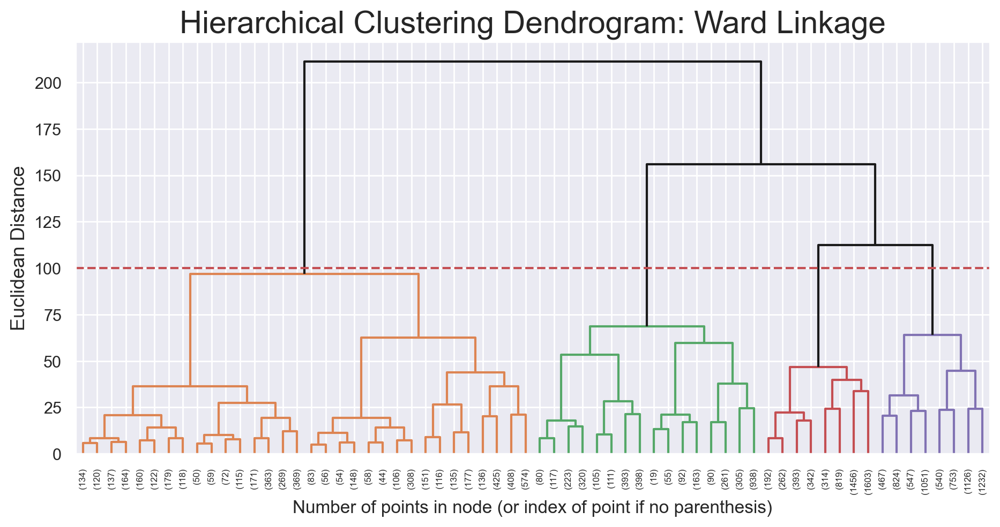

In [157]:
# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [158]:
linkage = 'ward'
distance = 'euclidean'
n_clusters = 4

hc4_clust = AgglomerativeClustering(linkage=linkage, metric=distance, n_clusters=n_clusters)
hc4_labels = hc4_clust.fit_predict(food_df[customer_value_profile])

In [159]:
# Characterizing the 4 clusters
df_concat = pd.concat([food_df[customer_value_profile], 
                       pd.Series(hc4_labels, 
                                 name='labels', 
                                 index=food_df.index)], 
                    axis=1)

df_concat.groupby('labels').mean()

,customer_lifetime,Average_Days_Between_Orders,average_spent_per_order,total_spent,total_orders,vendor_count
labels,,,,,,
0,0.237673,-0.404197,-0.070574,0.903346,1.419339,0.996416
1,0.183575,0.807990,-0.146527,-0.282862,-0.063507,-0.364832
2,-0.313747,0.247680,1.519127,1.031992,0.047593,-0.231063
3,-0.895834,-0.170291,-0.090218,-0.184404,0.005203,-0.296320


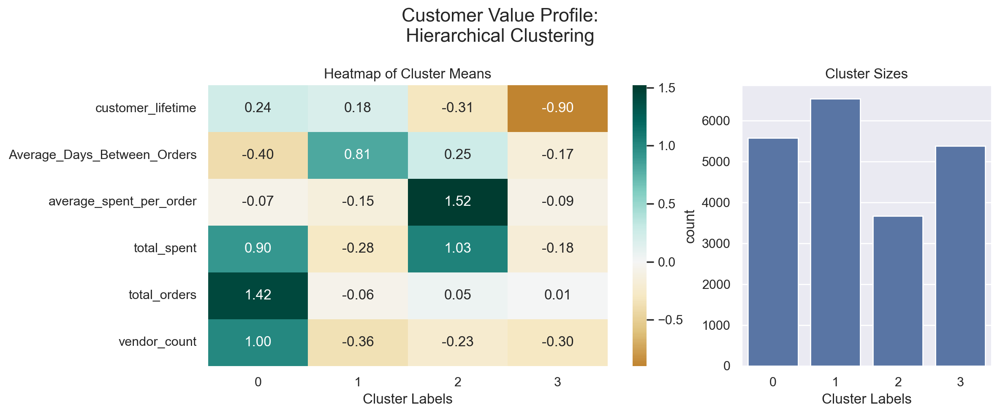

In [160]:
# Group by the cluster labels and calculate mean for each feature
hc_profile = df_concat.groupby('labels').mean().T

# Create subplots for heatmap and count plot
fig, axes = plt.subplots(1, 2, figsize=(12, 5), width_ratios=[0.6, 0.3], tight_layout=True)

# Heatmap of cluster means
sns.heatmap(
    hc_profile,
    center=0, 
    annot=True, 
    cmap="BrBG", 
    fmt=".2f", 
    ax=axes[0]
)
axes[0].set_xlabel("Cluster Labels")
axes[0].set_title("Heatmap of Cluster Means")

# Bar plot of cluster sizes
sns.countplot(x='labels', data=df_concat, ax=axes[1])
axes[1].set_title("Cluster Sizes")
axes[1].set_xlabel("Cluster Labels")

# Add overall title
fig.suptitle("Customer Value Profile:\nHierarchical Clustering", fontsize=16)
plt.show()


>The hierarchical clustering algorithm for the customer value profile, gave us 4 clusters:
- `Cluster 0`: These customers have the highest total orders, they spent the most in general , and mostly from unique vendors, these customers are very active as they have the lowest average days between orders and the highest customer lifetime.
- `Cluster 1`: These are the customers with the highest average days between orders, indicating that these customers aren't so active customes, having the lowest total orders and total spent.
- `Cluster 2`:These are the customers that have the highest average spent per order and total spent overall, but they have a low average day between orders and low customer lifetime
- `Cluster 3`: Represent the customers that lowest avergae spent per order and average days between orders, these customers seem to be the least active ones.

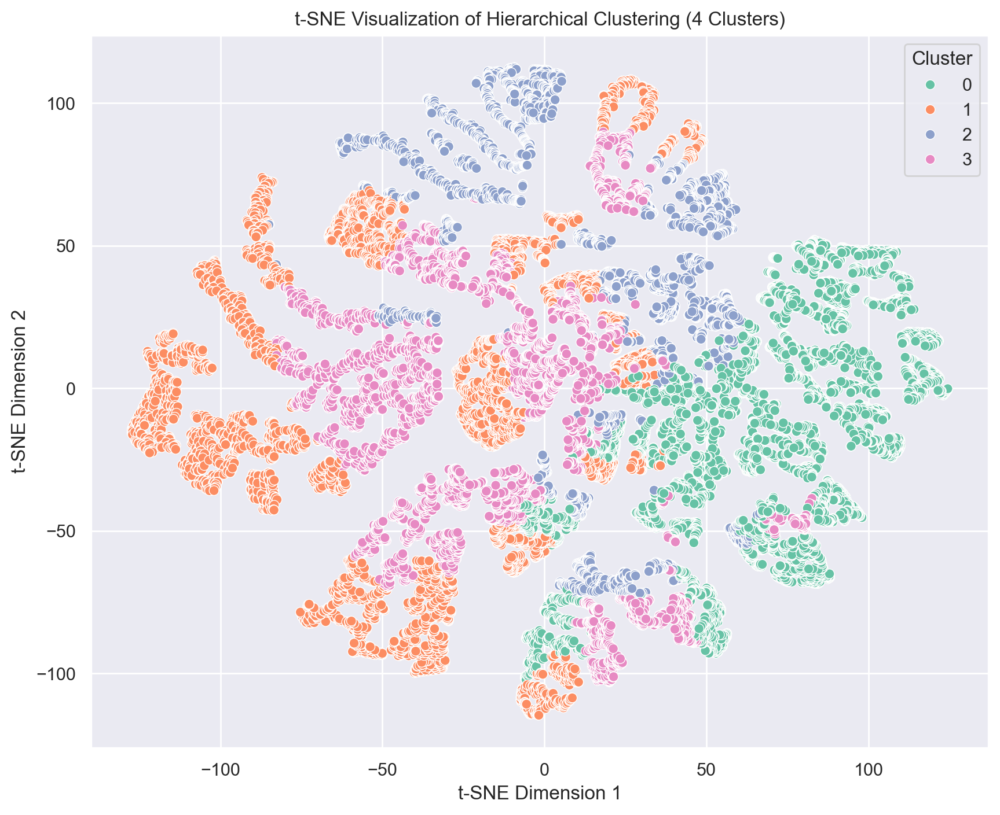

In [161]:
#Number of components for t-SNE
n_components = 2

tsne = TSNE(n_components=n_components, random_state=42, perplexity=30, n_iter=1000)
tsne_results = tsne.fit_transform(food_df[customer_value_profile])

# Create a DataFrame for the t-SNE results and cluster labels
tsne_df = pd.DataFrame(tsne_results, columns=['t-SNE1', 't-SNE2'])
tsne_df['Cluster'] = hc4_labels  # Add cluster labels

# Plot t-SNE results
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x='t-SNE1', y='t-SNE2', hue='Cluster', palette='Set2', data=tsne_df, legend='full'
)
plt.title('t-SNE Visualization of Hierarchical Clustering (4 Clusters)')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Cluster', loc='best')
plt.show()


For the clustering solution for the customer value, it seems that the clusters overlap between each other, indicating that the data points might not be easily separable.

#### Scores

In [162]:

# Silhouette Score for Hierarchical Clustering
hc_silhouette = silhouette_score(food_df[customer_value_profile], hc4_labels)
print(f"Hierarchical Clustering Silhouette Score: {hc_silhouette:.3f}")


Hierarchical Clustering Silhouette Score: 0.225


In [163]:

# Calinski-Harabasz Index for Hierarchical Clustering
hc_chi = calinski_harabasz_score(food_df[customer_value_profile], hc4_labels)
print(f"Hierarchical Clustering Calinski-Harabasz Index: {hc_chi:.3f}")

Hierarchical Clustering Calinski-Harabasz Index: 7825.866


In [164]:
#SST (Total Sum of Squares) 
sst_hc = get_ss_score(food_df[customer_value_profile])  

# SSW (Sum of Squares Within)
ssw_labels_hc = df_concat.groupby(by='labels').apply(get_ss_score) 
ssb_hc = sst_hc - np.sum(ssw_labels_hc)

#R2 Score
r2_hc = ssb_hc / sst_hc
print(f"Hierarchical Clustering R²: \033[1;35m{r2_hc:.4f}\033[1;0m")

Hierarchical Clustering R²: 0.5259


# Final Insights

After analysing different types of clustering algorithms, it was important to evaluate, which one to use. The following table gives an overall of the results of each cluster:

| Cluster                | Perspective     | R²     | Calinski Harabasz | Silhouette |
|------------------------|-----------------|--------|-------------------|------------|
| K-Means                | Preferences     | 0.292  | 5845.802          | 0.388      |
|                        | Customer Value  | 0.479  | 9736.893          | 0.327      |
| Mean-Shift             | Preferences     | 0.3644 | 4045.9949         | 0.3861     |
|                        | Customer Value  | 0.0563 | 1263.3519         | 0.4737     |
| Hierarchical Clustering| Preferences     | 0.4540 | 5866.679          | 0.267      |
|                        | Customer Value  | 0.5259 | 7825.866          | 0.225      |


Based on the table above and the overall anlysis conducted, we decided the following:
- `Preferences Profile`: We decided to choose the **Hierarchical clustering algorithm** for this perspective. This decision is based on the fact that it has shown the best overall score across the three metrics (R², Calinski-Harabasz, Silhouette). Additionally, the clustering solutions appeared reasonable, and the t-SNE visualization showed good separation between the clusters, indicating that the clustering algorithm worked effectively.

- `Customer Value Profile`: For this perspective, we selected **K-Means**. This choice was driven by the algorithm’s strong performance across the three metrics. Despite some slight overlap in the t-SNE visualization, the clusters were still relatively well-separated, and the overall consistency in the metrics led us to keep it as the preferred algorithm.
